In [1]:
import sys
import os
import itertools
import pandas as pd
current_dir = os.getcwd()
print(current_dir)

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all


In [2]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['..\\..\\..\\..\\UCB-USACE-LSTMs', 'F:\\Dino\\UCB-USACE-LSTMs\\UCB_training\\models\\calpella_all', 'C:\\Users\\Dino\\anaconda3\\python312.zip', 'C:\\Users\\Dino\\anaconda3\\DLLs', 'C:\\Users\\Dino\\anaconda3\\Lib', 'C:\\Users\\Dino\\anaconda3', '', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\win32\\lib', 'C:\\Users\\Dino\\anaconda3\\Lib\\site-packages\\Pythonwin']


In [3]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot

In [4]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

target_path = os.path.join(library_path, 'UCB_training', 'models', 'calpella_all')

if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("calpella")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all
Train Basin File Exists: True


In [5]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("calpella_gage_nlayer.yaml")
path_to_physics_data = Path(library_path + "/russian_river_data/Calpella_daily.csv")

In [6]:
features_with_physics = [
    #from daily
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "POTTER VALLEY CA FLOW USGS_ADJUSTED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    #from new capella.csv
    'Capella Gage FLOW',
    'EF Russian 20 ET-POTENTIAL',
    'EF Russian 20 FLOW',
    'EF Russian 20 FLOW-BASE',
    'EF Russian 20 INFILTRATION',
    'EF Russian 20 PERC-SOIL',
    'EF Russian 20 SATURATION FRACTION',
]


In [7]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "seq_length": [90, 180],
    "num_layers": [1, 2],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
search_results = []

In [8]:
approaches = [
    {
        "name": "NoPhysics",
        "physics_informed": False,
        "input_features": None,
        "physics_data_file": None
    },
    {
        "name": "Physics",
        "physics_informed": True,
        "input_features": features_with_physics,
        "physics_data_file": path_to_physics_data
    }
]

Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:12:20,439: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201220\output.log initialized.
2025-02-12 20:12:20,440: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201220
2025-02-12 20:12:20,443: ### Run configurations for testing_run
2025-02-12 20:12:20,444: experiment_name: testing_run
2025-02-12 20:12:20,445: train_basin_file: calpella
2025-02-12 20:12:20,446: validation_basin_file: calpella
2025-02-12 20:12:20,447: test_basin_file: calpella
2025-02-12 20:12:20,449: train_start_date: 1994-10-01 00:00:00
2025-02-12 20:12:20,450: train_end_date: 2002-09-30 00:00:00
2025-02-12 20:12:20,452: validation_start_date: 2002-10-01 00:00:00
2025-02-12 20:12:20,454: validation_end_date: 2005-09-30 00:00:00
2025-02-12 20:12:20,45

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]
2025-02-12 20:12:43,258: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201220\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:12:43,261: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201220\validation\model_epoch016\validation_results.p
got predictions


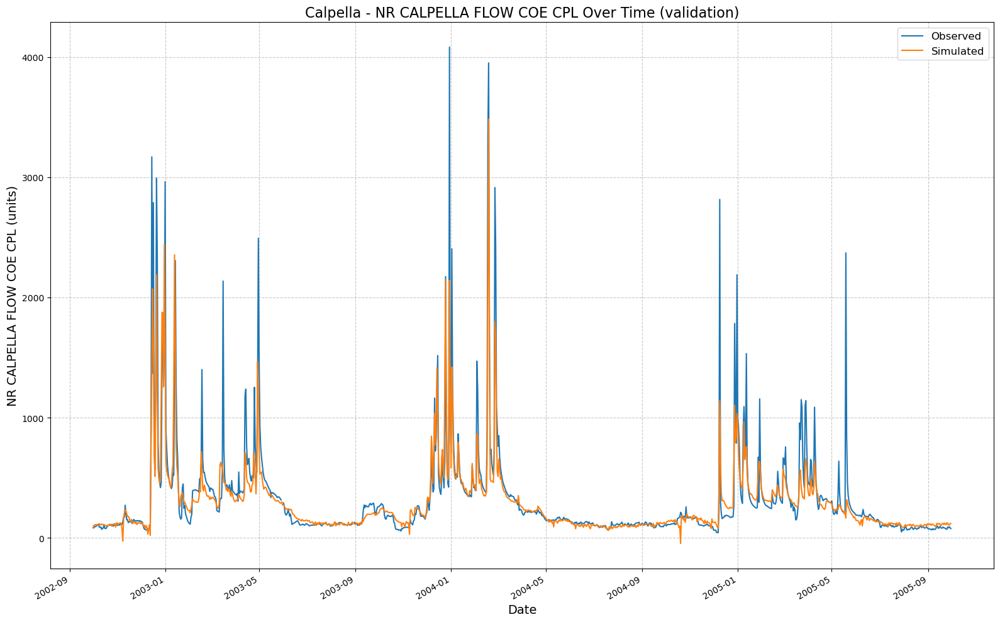

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201220\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7537567913532257, 'MSE': 42183.9921875, 'RMSE': 205.3874197401097, 'KGE': 0.6942151545651345, 'Alpha-NSE': 0.7320433894677949, 'Beta-KGE': 0.9089730381965637, 'Beta-NSE': -0.06964211902861364, 'Pearson-r': 0.8841651227196554, 'FHV': -27.24721133708954, 'FMS': -9.699299155267333, 'FLV': -2248.1323367349555, 'Peak-Timing': 0.6, 'Peak-MAPE': 61.2689733505249}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:12:44,059: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201244\output.log initialized.
2025-02-12 20:12:44,059: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201244
2025-02-12 20:12:44,059: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.08it/s]
2025-02-12 20:12:44,475: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 502.25it/s]
2025-02-12 20:12:44,492: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 11.91it/s, Loss: 0.0000]
2025-02-12 20:12:45,756: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 13.02it/s, Loss: 0.0000]
2025-02-12 20:12:46,603: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 13.40it/s, Loss: 0.0000]
2025-02-12 20:12:47,432: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.19it/s, Loss: 0.0000]
2025-02-12 20:12:48,274: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 12.97it/s, Loss: 0.0000]
2025-02-12 20:12:49,129: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]
2025-02-12 20:13:18,588: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201244\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:13:18,594: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201244\validation\model_epoch032\validation_results.p
got predictions


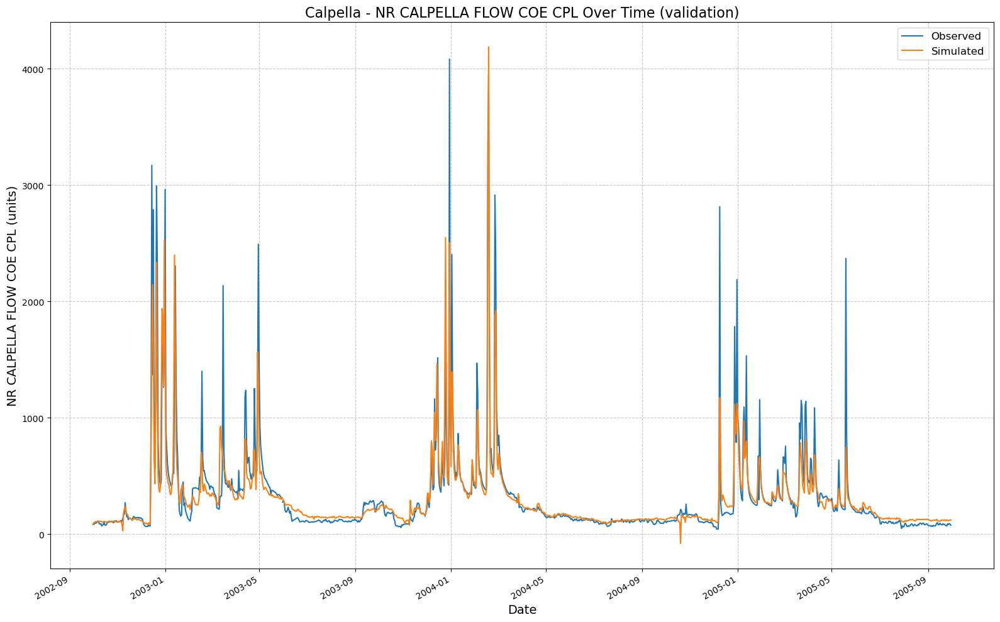

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201244\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7913197129964828, 'MSE': 35749.078125, 'RMSE': 189.07426616279648, 'KGE': 0.7571459254538424, 'Alpha-NSE': 0.7849913814168039, 'Beta-KGE': 0.9529607892036438, 'Beta-NSE': -0.035988354405814715, 'Pearson-r': 0.8973515313983089, 'FHV': -21.550969779491425, 'FMS': -20.71830224452185, 'FLV': -2272.6144168961287, 'Peak-Timing': 0.4, 'Peak-MAPE': 52.4510669708252}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:13:19,390: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201319\output.log initialized.
2025-02-12 20:13:19,393: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201319
2025-02-12 20:13:19,394:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.54it/s]
2025-02-12 20:13:19,780: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.97it/s]
2025-02-12 20:13:19,804: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 11.35it/s, Loss: 0.0000]
2025-02-12 20:13:21,155: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 11.89it/s, Loss: 0.0000]
2025-02-12 20:13:22,086: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 11.83it/s, Loss: 0.0000]
2025-02-12 20:13:23,023: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 11.82it/s, Loss: 0.0000]
2025-02-12 20:13:23,963: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 11.80it/s, Loss: 0.0000]
2025-02-12 20:13:24,904: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]
2025-02-12 20:13:37,661: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201319\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:13:37,664: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201319\validation\model_epoch016\validation_results.p
got predictions


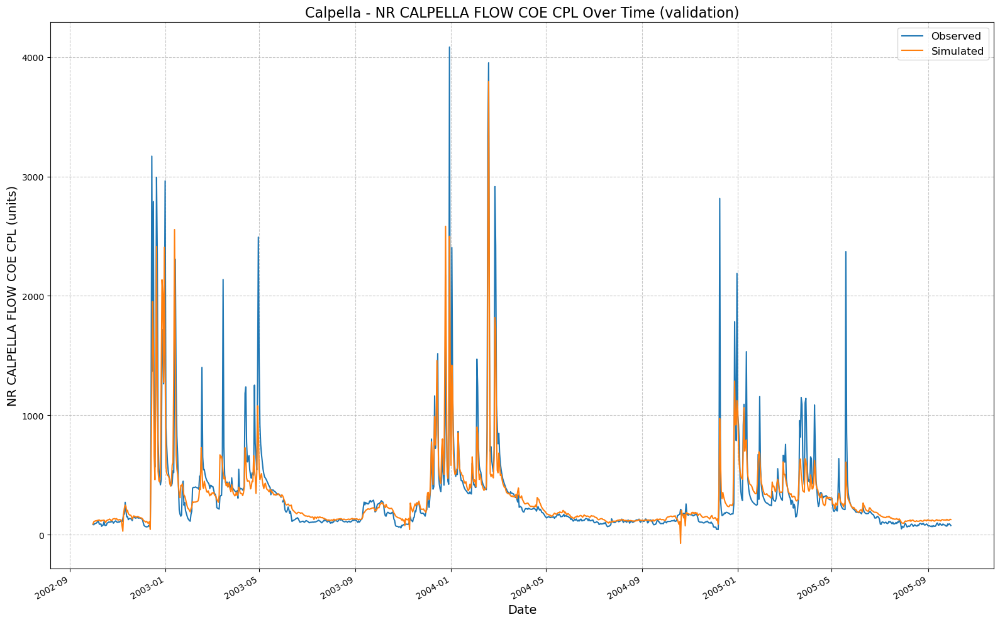

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201319\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7485975623130798, 'MSE': 43067.8203125, 'RMSE': 207.52787839830097, 'KGE': 0.7206866275548707, 'Alpha-NSE': 0.7524208198544315, 'Beta-KGE': 0.9709476828575134, 'Beta-NSE': -0.022227082008300206, 'Pearson-r': 0.8739981251973922, 'FHV': -24.051782488822937, 'FMS': -18.22499349427176, 'FLV': -2275.448065076143, 'Peak-Timing': 0.4, 'Peak-MAPE': 60.96033573150634}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:13:38,507: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201338\output.log initialized.
2025-02-12 20:13:38,507: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201338
2025-02-12 20:13:38,507

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.40it/s]
2025-02-12 20:13:38,901: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1047.53it/s]
2025-02-12 20:13:38,917: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:00<00:00, 13.01it/s, Loss: 0.0000]
2025-02-12 20:13:40,065: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 13.27it/s, Loss: 0.0000]
2025-02-12 20:13:40,902: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 13.15it/s, Loss: 0.0000]
2025-02-12 20:13:41,747: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 13.20it/s, Loss: 0.0000]
2025-02-12 20:13:42,588: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 13.21it/s, Loss: 0.0000]
2025-02-12 20:13:43,428: Epoch 5 avera

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]
2025-02-12 20:14:14,689: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201338\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:14:14,691: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201338\validation\model_epoch032\validation_results.p
got predictions


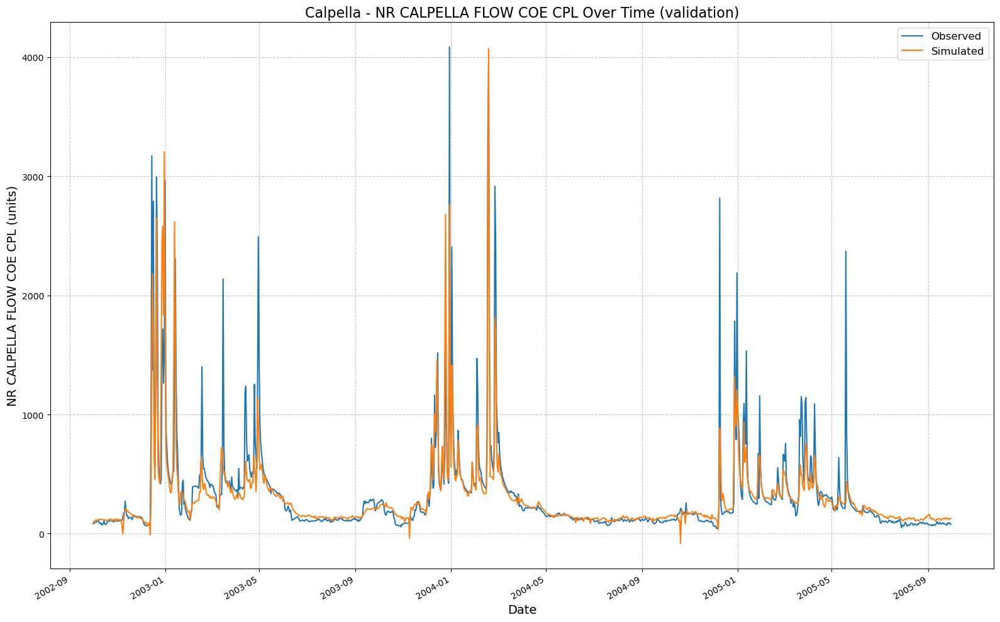

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201338\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7446897625923157, 'MSE': 43737.26953125, 'RMSE': 209.13457277851026, 'KGE': 0.7615225817736434, 'Alpha-NSE': 0.8116840677648177, 'Beta-KGE': 0.9417023658752441, 'Beta-NSE': -0.044601850064523246, 'Pearson-r': 0.865798753635598, 'FHV': -16.340631246566772, 'FMS': -21.95976585742485, 'FLV': -2253.124274563443, 'Peak-Timing': 0.6, 'Peak-MAPE': 60.533461570739746}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:14:15,438: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201415\output.log initialized.
2025-02-12 20:14:15,440: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201415
2025-02-12 20:14:15,4

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.06it/s]
2025-02-12 20:14:15,862: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 184.65it/s]
2025-02-12 20:14:15,884: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  5.42it/s, Loss: 0.0000]
2025-02-12 20:14:18,281: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.72it/s, Loss: 0.0000]
2025-02-12 20:14:20,618: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.23it/s, Loss: 0.0000]
2025-02-12 20:14:23,228: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.09it/s, Loss: 0.0000]
2025-02-12 20:14:25,928: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.17it/s, Loss: 0.0000]
2025-02-12 20:14:28,569: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]
2025-02-12 20:14:59,514: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201415\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:14:59,516: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201415\validation\model_epoch016\validation_results.p
got predictions


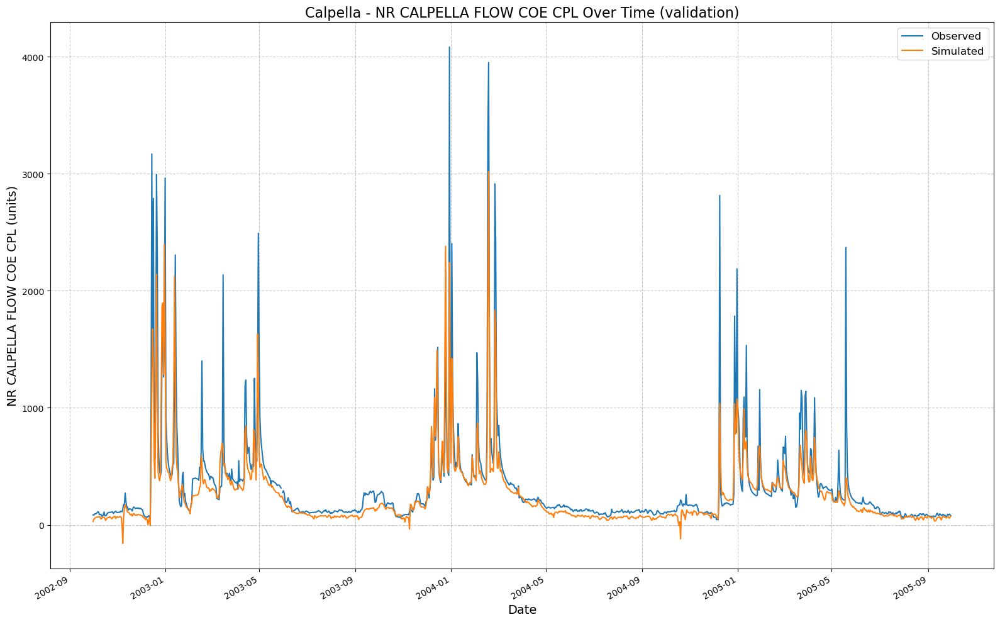

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201415\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7396639287471771, 'MSE': 44598.23828125, 'RMSE': 211.1829497882109, 'KGE': 0.6453161211999239, 'Alpha-NSE': 0.734917184477201, 'Beta-KGE': 0.7927796244621277, 'Beta-NSE': -0.15853835494406143, 'Pearson-r': 0.8877882770958578, 'FHV': -30.282744765281677, 'FMS': 24.04012484520684, 'FLV': -2154.1441473030554, 'Peak-Timing': 0.4, 'Peak-MAPE': 61.62149906158447}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:15:00,333: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201500\output.log initialized.
2025-02-12 20:15:00,334: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201500
2025-02-12 20:15:00,335:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]
2025-02-12 20:15:00,735: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.95it/s]
2025-02-12 20:15:00,746: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.57it/s, Loss: 0.0000]
2025-02-12 20:15:03,473: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.80it/s, Loss: 0.0000]
2025-02-12 20:15:05,773: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.64it/s, Loss: 0.0000]
2025-02-12 20:15:08,150: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-12 20:15:10,553: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.68it/s, Loss: 0.0000]
2025-02-12 20:15:12,909: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]
2025-02-12 20:16:21,060: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201500\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:16:21,063: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201500\validation\model_epoch032\validation_results.p
got predictions


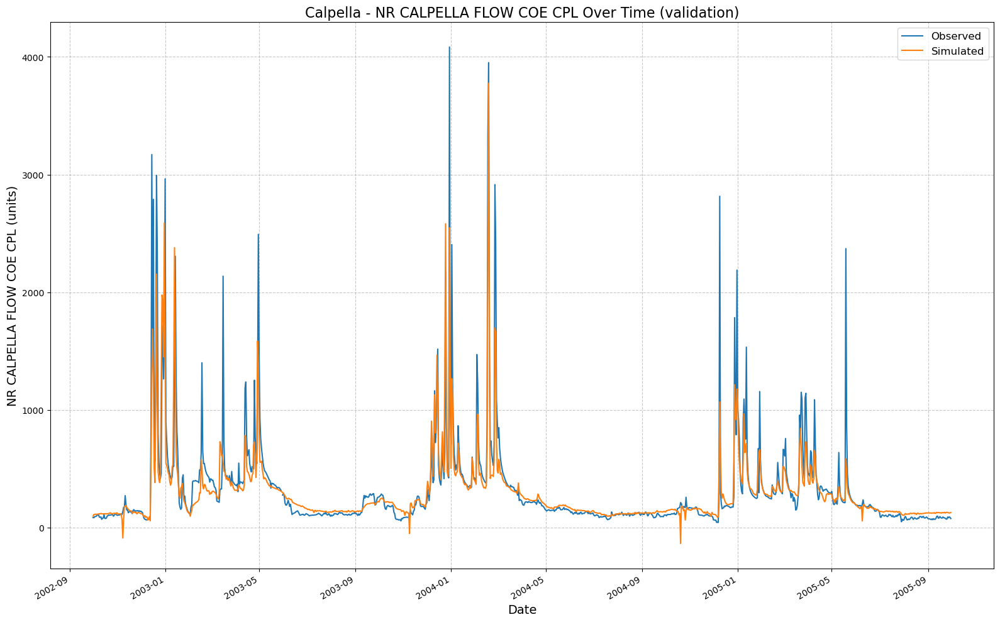

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201500\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7584832310676575, 'MSE': 41374.30078125, 'RMSE': 203.40673730545407, 'KGE': 0.7066337250824717, 'Alpha-NSE': 0.7417192956429888, 'Beta-KGE': 0.9223909974098206, 'Beta-NSE': -0.05937642718325767, 'Pearson-r': 0.8845370547197478, 'FHV': -26.324790716171265, 'FMS': -21.80790764584836, 'FLV': -2259.634197379045, 'Peak-Timing': 0.4, 'Peak-MAPE': 55.60769081115723}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:16:21,767: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201621\output.log initialized.
2025-02-12 20:16:21,769: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201621
2025-02-12 20:16:21,77

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.10it/s]
2025-02-12 20:16:22,178: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.05it/s]
2025-02-12 20:16:22,196: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.66it/s, Loss: 0.0000]
2025-02-12 20:16:24,921: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.71it/s, Loss: 0.0000]
2025-02-12 20:16:27,263: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.70it/s, Loss: 0.0000]
2025-02-12 20:16:29,615: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-12 20:16:31,971: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.65it/s, Loss: 0.0000]
2025-02-12 20:16:34,354: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]
2025-02-12 20:17:04,480: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201621\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:17:04,483: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201621\validation\model_epoch016\validation_results.p
got predictions


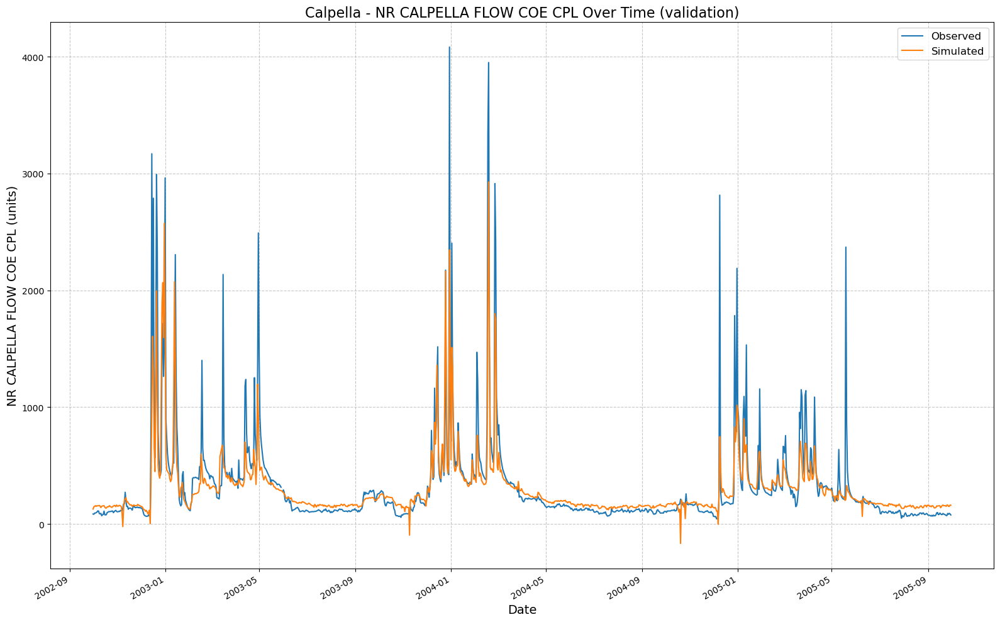

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201621\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7148049473762512, 'MSE': 48856.8359375, 'RMSE': 221.03582500920524, 'KGE': 0.6338286108425975, 'Alpha-NSE': 0.662969083846597, 'Beta-KGE': 0.9350348711013794, 'Beta-NSE': -0.049702954178099494, 'Pearson-r': 0.8724414651172046, 'FHV': -30.132564902305603, 'FMS': -33.77951032478752, 'FLV': -2275.44273079155, 'Peak-Timing': 0.6, 'Peak-MAPE': 67.44194984436035}
Approach: NoPhysics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:17:05,199: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201705\output.log initialized.
2025-02-12 20:17:05,199: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201705
2025-02-12 20:17:05,215:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.49it/s]
2025-02-12 20:17:05,633: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.10it/s]
2025-02-12 20:17:05,658: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.57it/s, Loss: 0.0000]
2025-02-12 20:17:08,452: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.54it/s, Loss: 0.0000]
2025-02-12 20:17:10,887: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.48it/s, Loss: 0.0000]
2025-02-12 20:17:13,352: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.11it/s, Loss: 0.0000]
2025-02-12 20:17:16,038: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.33it/s, Loss: 0.0000]
2025-02-12 20:17:18,591: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]
2025-02-12 20:18:29,406: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201705\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:18:29,411: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201705\validation\model_epoch032\validation_results.p
got predictions


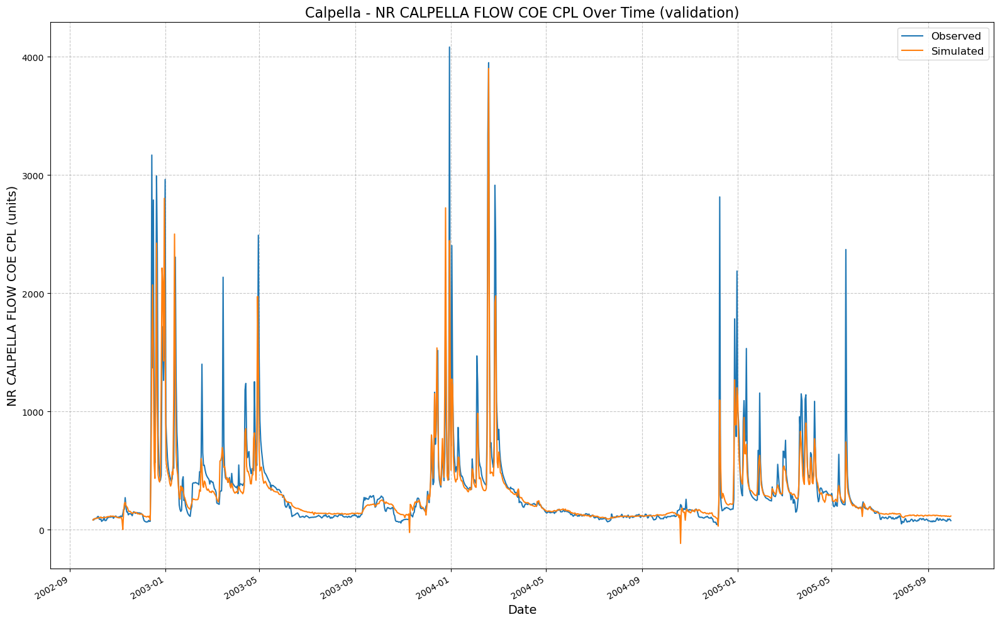

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201705\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7785856574773788, 'MSE': 37930.55078125, 'RMSE': 194.75767194452186, 'KGE': 0.7486265332515268, 'Alpha-NSE': 0.7843068495801012, 'Beta-KGE': 0.9320640563964844, 'Beta-NSE': -0.05197582992111958, 'Pearson-r': 0.8902284544438559, 'FHV': -20.482945442199707, 'FMS': -20.56561047988781, 'FLV': -2261.830398550163, 'Peak-Timing': 0.4, 'Peak-MAPE': 52.77299880981445}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:18:30,090: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201830\output.log initialized.
2025-02-12 20:18:30,092: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201830
2025-02-12 20:18:30,09

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.52it/s]
2025-02-12 20:18:30,467: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1000.07it/s]
2025-02-12 20:18:30,481: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.46it/s, Loss: 0.0000]
2025-02-12 20:18:32,344: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.62it/s, Loss: 0.0000]
2025-02-12 20:18:33,497: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.70it/s, Loss: 0.0000]
2025-02-12 20:18:34,639: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.56it/s, Loss: 0.0000]
2025-02-12 20:18:35,798: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.58it/s, Loss: 0.0000]
2025-02-12 20:18:36,953: Epoch 5 avera

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]
2025-02-12 20:18:53,311: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201830\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:18:53,314: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201830\validation\model_epoch016\validation_results.p
got predictions


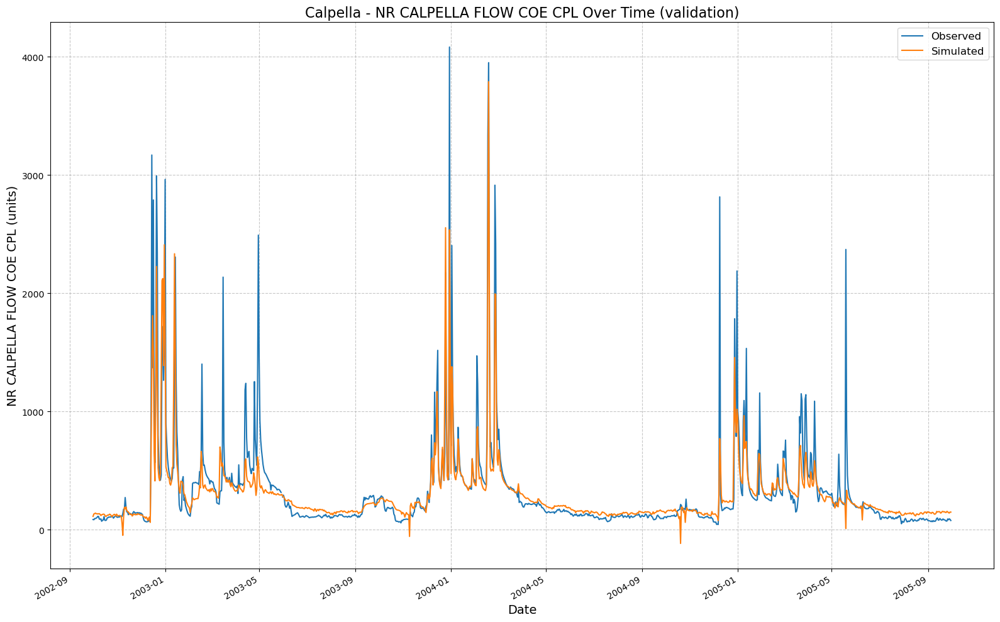

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201830\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7268023192882538, 'MSE': 46801.5703125, 'RMSE': 216.33670588344458, 'KGE': 0.68952778420089, 'Alpha-NSE': 0.7281380778281141, 'Beta-KGE': 0.9350556135177612, 'Beta-NSE': -0.049687101706654954, 'Pearson-r': 0.8648470543396769, 'FHV': -23.839934170246124, 'FMS': -29.671306191849546, 'FLV': -2271.055662733908, 'Peak-Timing': 0.6, 'Peak-MAPE': 68.62149238586426}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:18:54,002: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201854\output.log initialized.
2025-02-12 20:18:54,004: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201854
2025-02-12 20:18:54,004

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.00it/s]
2025-02-12 20:18:54,345: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.83it/s]
2025-02-12 20:18:54,366: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.07it/s, Loss: 0.0000]
2025-02-12 20:18:55,972: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.67it/s, Loss: 0.0000]
2025-02-12 20:18:57,117: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.88it/s, Loss: 0.0000]
2025-02-12 20:18:58,238: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.83it/s, Loss: 0.0000]
2025-02-12 20:18:59,364: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.72it/s, Loss: 0.0000]
2025-02-12 20:19:00,503: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]
2025-02-12 20:19:36,213: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201854\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:19:36,216: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201854\validation\model_epoch032\validation_results.p
got predictions


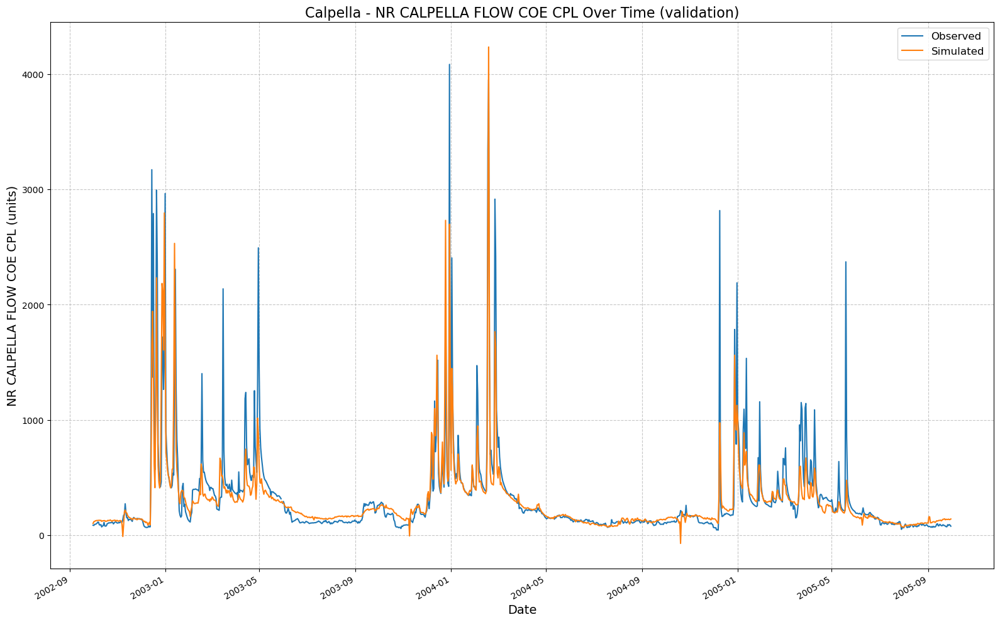

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201854\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.746114045381546, 'MSE': 43493.26953125, 'RMSE': 208.55040045813865, 'KGE': 0.7348132020059455, 'Alpha-NSE': 0.7825376400344655, 'Beta-KGE': 0.9211479425430298, 'Beta-NSE': -0.06032742800507928, 'Pearson-r': 0.8703215019235555, 'FHV': -20.264452695846558, 'FMS': -25.623496766808994, 'FLV': -2253.442045517071, 'Peak-Timing': 0.6, 'Peak-MAPE': 59.9733543395996}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:19:36,932: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201936\output.log initialized.
2025-02-12 20:19:36,940: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201936
2025-02-12 20:19:36,940

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.81it/s]
2025-02-12 20:19:37,394: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.95it/s]
2025-02-12 20:19:37,408: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.52it/s, Loss: 0.0000]
2025-02-12 20:19:39,003: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.91it/s, Loss: 0.0000]
2025-02-12 20:19:40,119: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.69it/s, Loss: 0.0000]
2025-02-12 20:19:41,263: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.68it/s, Loss: 0.0000]
2025-02-12 20:19:42,408: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.90it/s, Loss: 0.0000]
2025-02-12 20:19:43,526: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]
2025-02-12 20:19:59,712: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201936\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:19:59,715: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201936\validation\model_epoch016\validation_results.p
got predictions


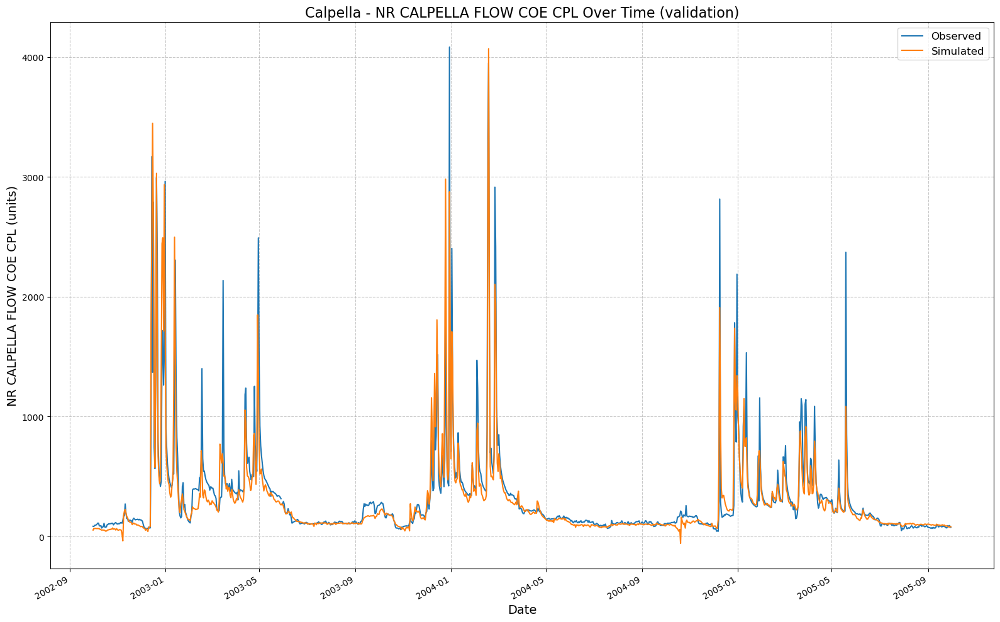

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_201936\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7995985299348831, 'MSE': 34330.83203125, 'RMSE': 185.28581173756936, 'KGE': 0.8681863421329006, 'Alpha-NSE': 0.9529419016506773, 'Beta-KGE': 0.931871235370636, 'Beta-NSE': -0.05212336850419176, 'Pearson-r': 0.8974385686033637, 'FHV': -5.946705490350723, 'FMS': -1.335996107384866, 'FLV': -2225.0381231188553, 'Peak-Timing': 0.4, 'Peak-MAPE': 36.5783166885376}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:20:00,491: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202000\output.log initialized.
2025-02-12 20:20:00,491: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202000
2025-02-12 20:20:00,491:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.61it/s]
2025-02-12 20:20:00,867: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.91it/s]
2025-02-12 20:20:00,890: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.60it/s, Loss: 0.0000]
2025-02-12 20:20:02,529: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00, 10.03it/s, Loss: 0.0000]
2025-02-12 20:20:03,633: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00, 10.04it/s, Loss: 0.0000]
2025-02-12 20:20:04,735: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00, 10.04it/s, Loss: 0.0000]
2025-02-12 20:20:05,838: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.99it/s, Loss: 0.0000]
2025-02-12 20:20:06,946: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]
2025-02-12 20:20:41,580: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202000\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:20:41,583: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202000\validation\model_epoch032\validation_results.p
got predictions


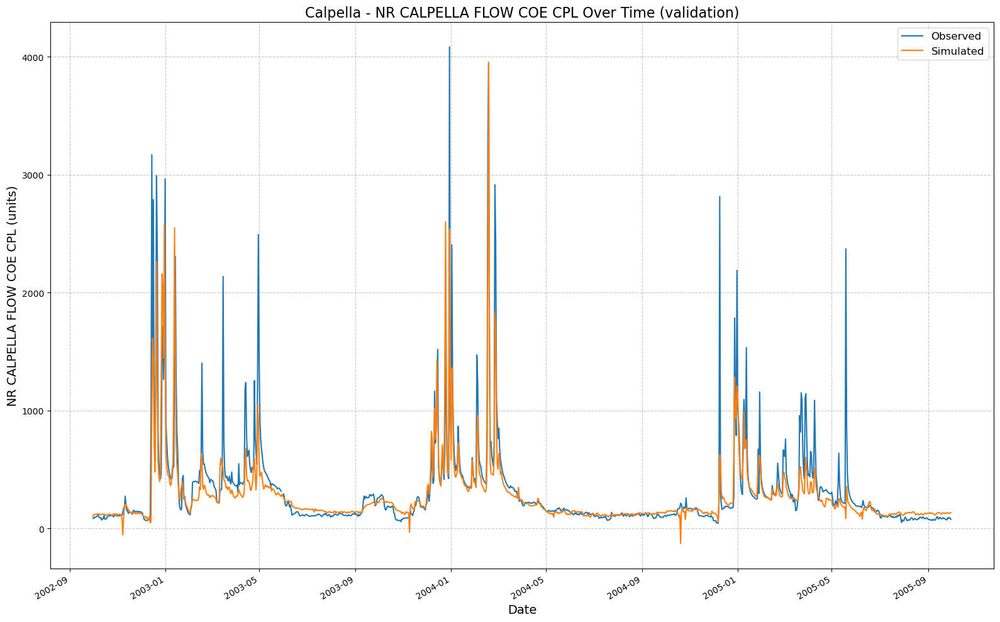

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202000\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7157433331012726, 'MSE': 48696.0859375, 'RMSE': 220.67189657385012, 'KGE': 0.6807906732401456, 'Alpha-NSE': 0.7436329470098331, 'Beta-KGE': 0.8717815279960632, 'Beta-NSE': -0.09809627301760421, 'Pearson-r': 0.8595345171631403, 'FHV': -24.5285302400589, 'FMS': -25.256960754136603, 'FLV': -2256.8333169472467, 'Peak-Timing': 0.6, 'Peak-MAPE': 68.72884750366211}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:20:42,342: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\output.log initialized.
2025-02-12 20:20:42,350: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042
2025-02-12 20:20:42,35

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:20:42,432: run_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042
2025-02-12 20:20:42,434: train_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\train_data
2025-02-12 20:20:42,435: img_log_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\img_log
2025-02-12 20:20:42,444: ### Device cpu will be used for training
2025-02-12 20:20:42,445: Loading basin data into xarray data set.
100%|██████████| 1/1 [00:00<00:00,  3.24it/s]
2025-02-12 20:20:42,764: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.29it/s]
2025-02-12 20:20:42,781: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s, Loss: 0.0000]
2025-02-12 20:20:46,374: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.58it/s, Loss: 0.0000]
2025-02-12 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]
2025-02-12 20:21:41,419: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:21:41,421: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\validation\model_epoch016\validation_results.p
got predictions


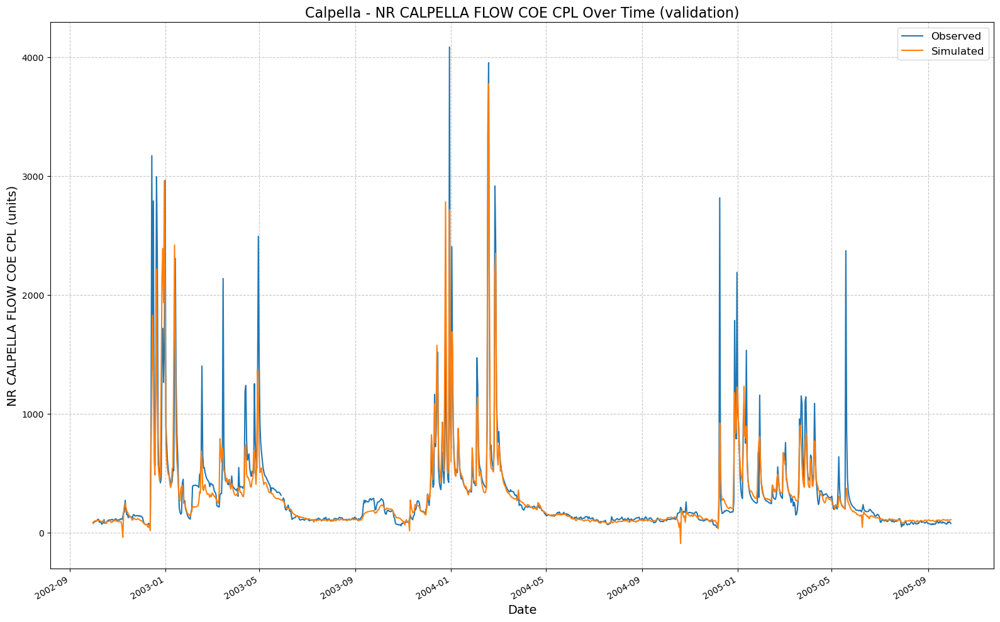

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202042\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7732952386140823, 'MSE': 38836.8515625, 'RMSE': 197.0706765668094, 'KGE': 0.7918846157835288, 'Alpha-NSE': 0.8451601372425872, 'Beta-KGE': 0.9265362024307251, 'Beta-NSE': -0.05620504810524626, 'Pearson-r': 0.88193349121984, 'FHV': -16.44967943429947, 'FMS': 0.8093042413357744, 'FLV': -2237.3652737935904, 'Peak-Timing': 0.6, 'Peak-MAPE': 60.42020320892334}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:21:42,102: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202142\output.log initialized.
2025-02-12 20:21:42,110: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202142
2025-02-12 20:21:42,112: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.90it/s]
2025-02-12 20:21:42,485: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.65it/s]
2025-02-12 20:21:42,506: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.12it/s, Loss: 0.0000]
2025-02-12 20:21:46,408: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.17it/s, Loss: 0.0000]
2025-02-12 20:21:49,882: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.20it/s, Loss: 0.0000]
2025-02-12 20:21:53,328: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.25it/s, Loss: 0.0000]
2025-02-12 20:21:56,716: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.19it/s, Loss: 0.0000]
2025-02-12 20:22:00,172: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]
2025-02-12 20:23:35,107: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202142\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:23:35,110: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202142\validation\model_epoch032\validation_results.p
got predictions


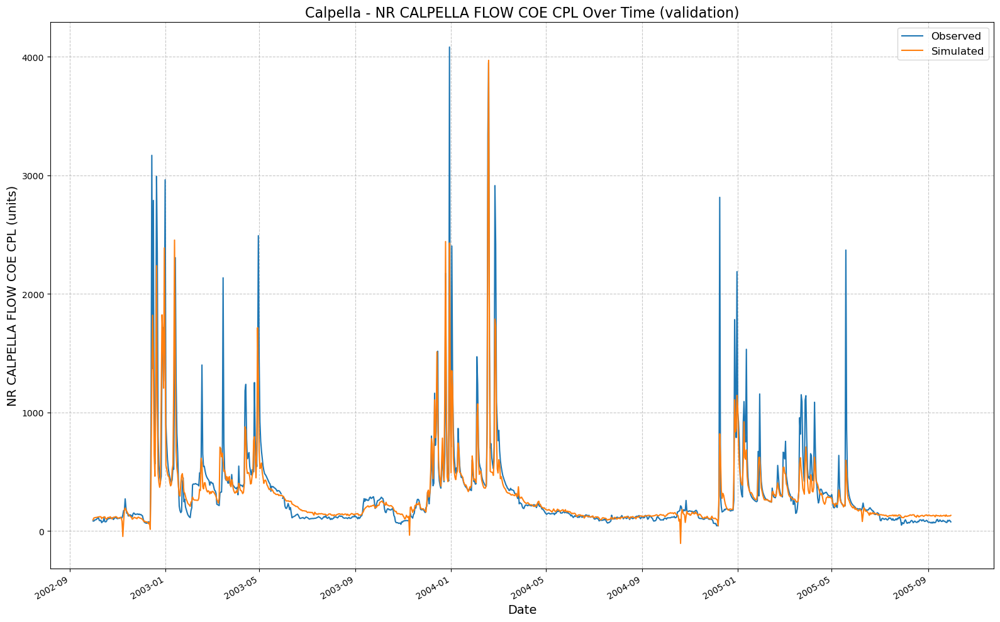

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202142\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7620409578084946, 'MSE': 40764.82421875, 'RMSE': 201.9030069581679, 'KGE': 0.7077471956068779, 'Alpha-NSE': 0.7431043592526895, 'Beta-KGE': 0.9186031222343445, 'Beta-NSE': -0.062274406428169796, 'Pearson-r': 0.8869032284692611, 'FHV': -25.95730423927307, 'FMS': -18.421825682180906, 'FLV': -2255.6614889282023, 'Peak-Timing': 0.4, 'Peak-MAPE': 58.45554828643799}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:23:35,901: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335\output.log initialized.
2025-02-12 20:23:35,907: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335
2025-02-12 20:23:35,

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:23:35,963: log_n_figures: 1
2025-02-12 20:23:35,965: save_weights_every: 16
2025-02-12 20:23:35,968: dataset: russian_river
2025-02-12 20:23:35,970: data_dir: F:\Dino\UCB-USACE-LSTMs\russian_river_data
2025-02-12 20:23:35,973: dynamic_inputs: ['EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'EF RUSSIAN 20 PRECIP-INC SCREENED', 'POTTER VALLEY CA FLOW USGS_ADJUSTED', 'UKIAH CA HUMIDITY USAF-NOAA', 'UKIAH CA SOLAR RADIATION USAF-NOAA', 'UKIAH CA TEMPERATURE USAF-NOAA', 'UKIAH CA WINDSPEED USAF-NOAA']
2025-02-12 20:23:35,975: target_variables: ['NR CALPELLA FLOW COE CPL']
2025-02-12 20:23:35,978: clip_targets_to_zero: [['NR CALPELLA FLOW COE CPL']]
2025-02-12 20:23:35,980: hourly: False
2025-02-12 20:23:35,982: number_of_basins: 1
2025-02-12 20:23:35,984: run_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335
2025-02-12 20:23:35,986: train_dir: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335\t

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]
2025-02-12 20:24:31,645: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:24:31,648: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335\validation\model_epoch016\validation_results.p
got predictions


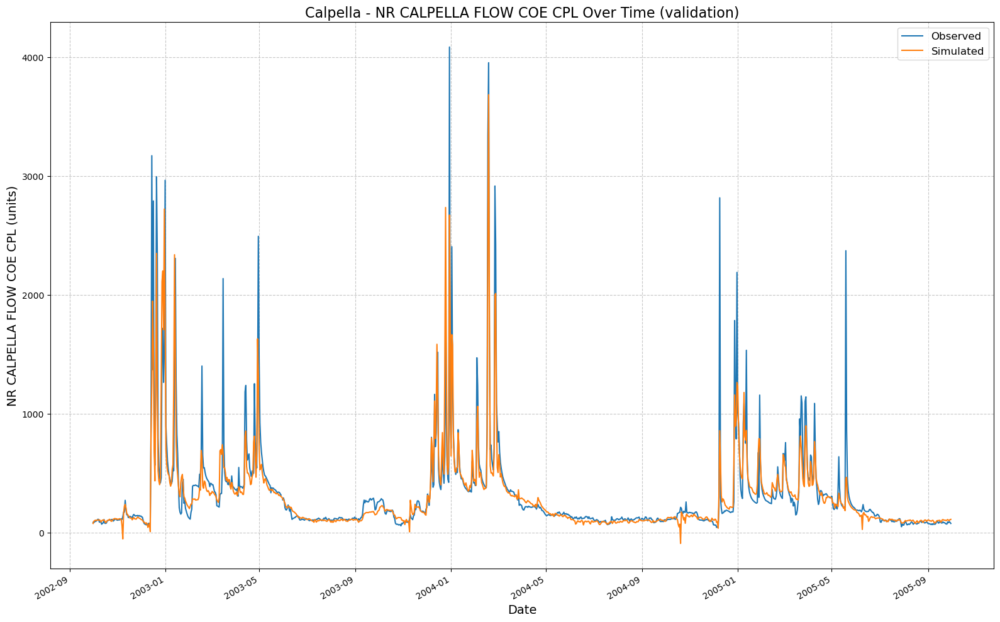

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202335\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7832089960575104, 'MSE': 37138.5234375, 'RMSE': 192.71357875743993, 'KGE': 0.7828370221866945, 'Alpha-NSE': 0.825568841974749, 'Beta-KGE': 0.934131920337677, 'Beta-NSE': -0.050393753270954716, 'Pearson-r': 0.8886674974488131, 'FHV': -18.73548924922943, 'FMS': 3.348458409751423, 'FLV': -2233.822927803326, 'Peak-Timing': 0.6, 'Peak-MAPE': 58.34826946258544}
Approach: NoPhysics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:24:32,412: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202432\output.log initialized.
2025-02-12 20:24:32,413: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202432
2025-02-12 20:24:32,416: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.29it/s]
2025-02-12 20:24:32,813: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 500.87it/s]
2025-02-12 20:24:32,839: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.32it/s, Loss: 0.0000]
2025-02-12 20:24:36,423: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s, Loss: 0.0000]
2025-02-12 20:24:39,626: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.36it/s, Loss: 0.0000]
2025-02-12 20:24:42,908: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.36it/s, Loss: 0.0000]
2025-02-12 20:24:46,195: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.37it/s, Loss: 0.0000]
2025-02-12 20:24:49,467: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]
2025-02-12 20:26:31,003: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202432\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:26:31,005: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202432\validation\model_epoch032\validation_results.p
got predictions


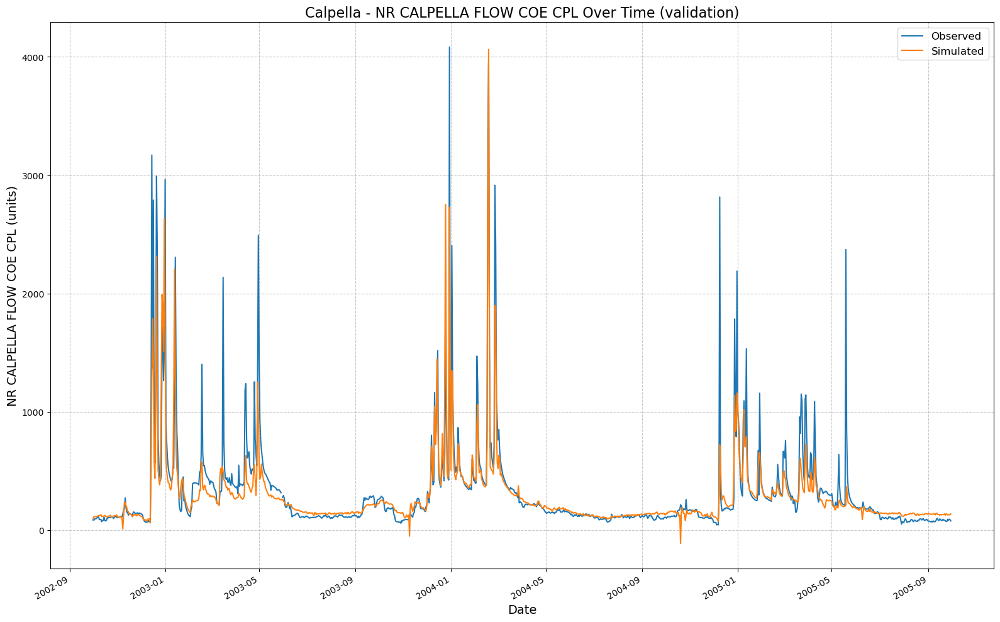

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202432\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7450583577156067, 'MSE': 43674.1171875, 'RMSE': 208.9835332926975, 'KGE': 0.7051487493045141, 'Alpha-NSE': 0.7533328899556824, 'Beta-KGE': 0.8973632454872131, 'Beta-NSE': -0.0785244431100514, 'Pearson-r': 0.8752671114655053, 'FHV': -23.592644929885864, 'FMS': -25.85329218926693, 'FLV': -2268.511971023571, 'Peak-Timing': 0.6, 'Peak-MAPE': 63.71800422668456}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:26:31,710: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202631\output.log initialized.
2025-02-12 20:26:31,710: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202631
2025-02-12 20:26:31,710: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.65it/s]
2025-02-12 20:26:32,049: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.53it/s]
2025-02-12 20:26:32,068: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.04it/s, Loss: 0.0000]
2025-02-12 20:26:36,038: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s, Loss: 0.0000]
2025-02-12 20:26:39,449: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s, Loss: 0.0000]
2025-02-12 20:26:42,818: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s, Loss: 0.0000]
2025-02-12 20:26:46,193: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.27it/s, Loss: 0.0000]
2025-02-12 20:26:49,577: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]
2025-02-12 20:27:31,918: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202631\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:27:31,921: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202631\validation\model_epoch016\validation_results.p
got predictions


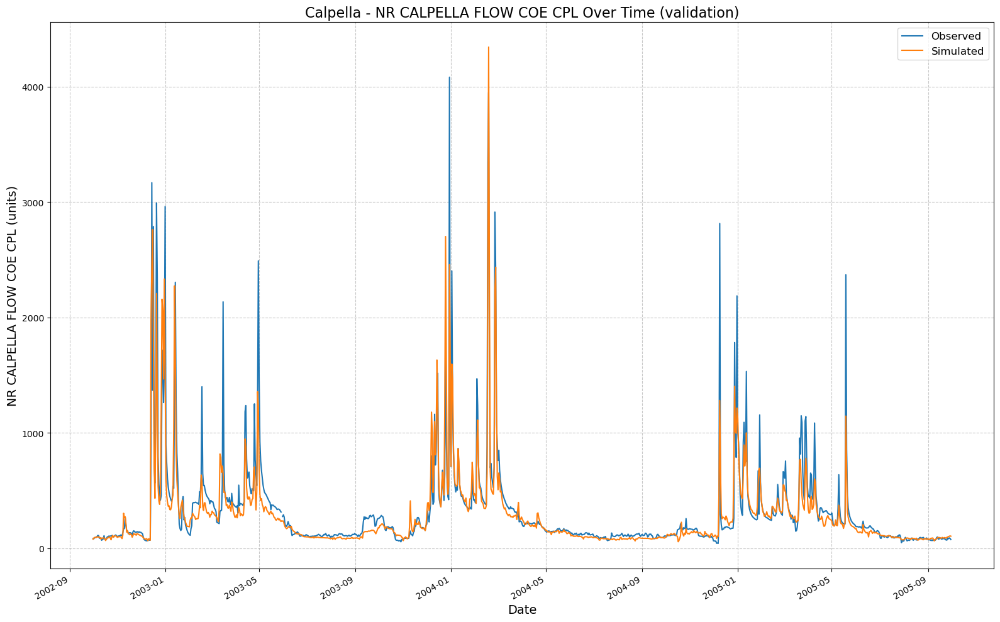

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202631\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7958245575428009, 'MSE': 34977.3515625, 'RMSE': 187.0223290478974, 'KGE': 0.8093230489264673, 'Alpha-NSE': 0.8717720865848718, 'Beta-KGE': 0.9053399562835693, 'Beta-NSE': -0.07242168399845633, 'Pearson-r': 0.8953349245664812, 'FHV': -13.91979455947876, 'FMS': 1.4020362428084734, 'FLV': 45.75795760965506, 'Peak-Timing': 0.4, 'Peak-MAPE': 43.856797218322754}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:27:32,680: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202732\output.log initialized.
2025-02-12 20:27:32,682: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202732
2025-02-12 20:27:32,684: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:27:32,780: Loading basin data into xarray data set.
100%|██████████| 1/1 [00:00<00:00,  3.30it/s]
2025-02-12 20:27:33,093: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 502.49it/s]
2025-02-12 20:27:33,109: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.11it/s, Loss: 0.0000]
2025-02-12 20:27:36,969: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.32it/s, Loss: 0.0000]
2025-02-12 20:27:40,293: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.29it/s, Loss: 0.0000]
2025-02-12 20:27:43,644: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.39it/s, Loss: 0.0000]
2025-02-12 20:27:46,911: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]
2025-02-12 20:29:23,991: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202732\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:29:23,994: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202732\validation\model_epoch032\validation_results.p
got predictions


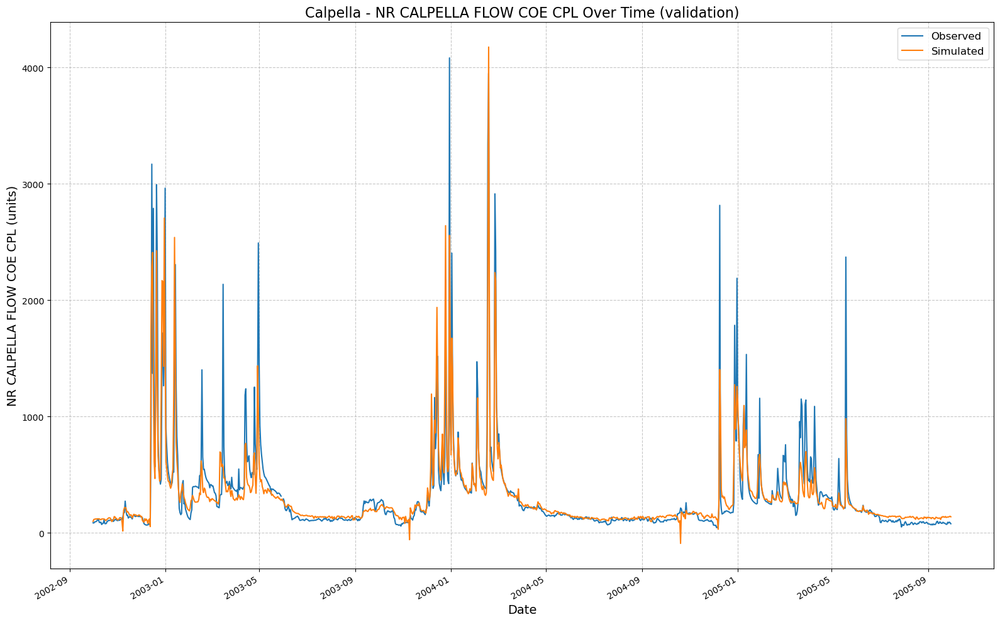

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202732\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7829137891530991, 'MSE': 37189.09765625, 'RMSE': 192.84475013919877, 'KGE': 0.7933595268127169, 'Alpha-NSE': 0.8323718379296406, 'Beta-KGE': 0.9568518400192261, 'Beta-NSE': -0.03301140773338119, 'Pearson-r': 0.8871314006011808, 'FHV': -15.92647135257721, 'FMS': -24.005418726992254, 'FLV': -2269.406987774257, 'Peak-Timing': 0.4, 'Peak-MAPE': 46.207356452941895}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:29:24,718: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202924\output.log initialized.
2025-02-12 20:29:24,718: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202924
2025-02-12 20:29:24,7

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.11it/s]
2025-02-12 20:29:25,070: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 335.01it/s]
2025-02-12 20:29:25,089: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.27it/s, Loss: 0.0000]
2025-02-12 20:29:28,781: Epoch 1 average loss: avg_loss: 0.00001, avg_total_loss: 0.00001
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s, Loss: 0.0000]
2025-02-12 20:29:32,068: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  2.86it/s, Loss: 0.0000]
2025-02-12 20:29:35,926: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.27it/s, Loss: 0.0000]
2025-02-12 20:29:39,294: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.24it/s, Loss: 0.0000]
2025-02-12 20:29:42,709: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]
2025-02-12 20:30:24,247: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202924\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:30:24,251: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202924\validation\model_epoch016\validation_results.p
got predictions


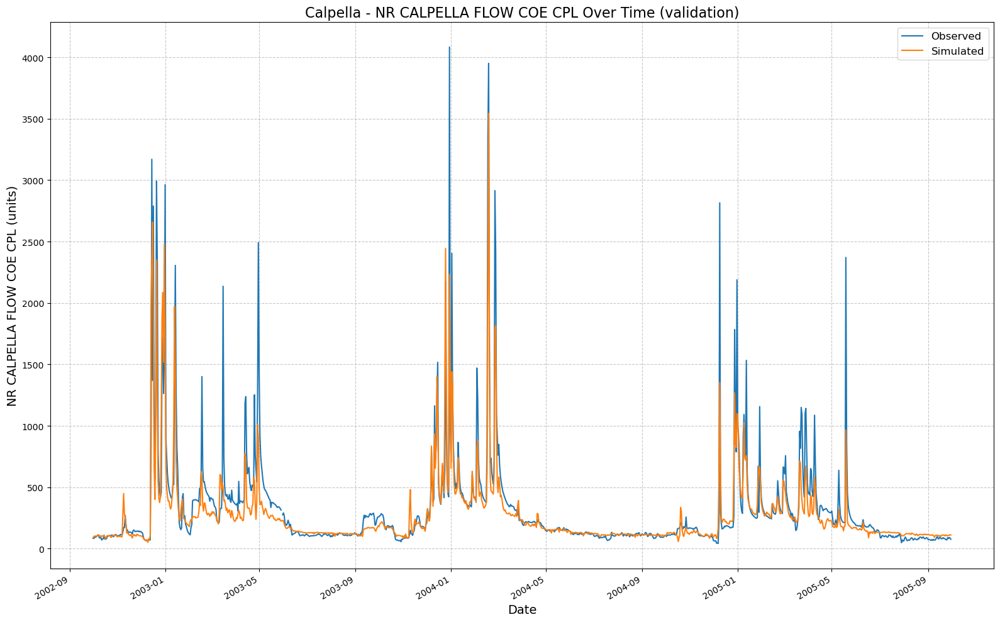

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_202924\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7648347467184067, 'MSE': 40286.2265625, 'RMSE': 200.71429087760544, 'KGE': 0.7067284888530663, 'Alpha-NSE': 0.7662345897387763, 'Beta-KGE': 0.861594021320343, 'Beta-NSE': -0.10589045396611878, 'Pearson-r': 0.8895206024566833, 'FHV': -21.80432230234146, 'FMS': -21.67889636580396, 'FLV': 4.837725804134761, 'Peak-Timing': 0.4, 'Peak-MAPE': 49.14757251739502}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:30:25,012: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203025\output.log initialized.
2025-02-12 20:30:25,028: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203025
2025-02-12 20:30:25,028: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.27it/s]
2025-02-12 20:30:25,423: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.87it/s]
2025-02-12 20:30:25,444: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s, Loss: 0.0000]
2025-02-12 20:30:29,129: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s, Loss: 0.0000]
2025-02-12 20:30:32,347: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.40it/s, Loss: 0.0000]
2025-02-12 20:30:35,592: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.37it/s, Loss: 0.0000]
2025-02-12 20:30:38,863: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.38it/s, Loss: 0.0000]
2025-02-12 20:30:42,133: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]
2025-02-12 20:32:16,479: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203025\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:32:16,482: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203025\validation\model_epoch032\validation_results.p
got predictions


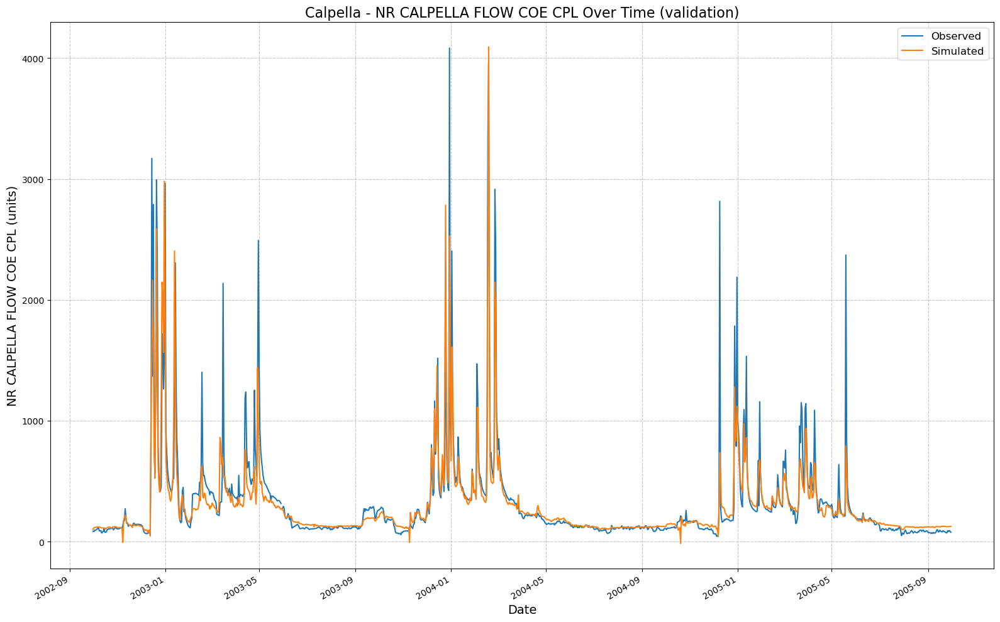

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203025\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7812760323286057, 'MSE': 37469.66015625, 'RMSE': 193.57081431933378, 'KGE': 0.7661591463543678, 'Alpha-NSE': 0.805549456245483, 'Beta-KGE': 0.9319072365760803, 'Beta-NSE': -0.0520957925771208, 'Pearson-r': 0.8893930090971427, 'FHV': -18.5326486825943, 'FMS': -18.365863960998652, 'FLV': -2257.8235887799556, 'Peak-Timing': 0.4, 'Peak-MAPE': 57.74126052856445}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:32:17,190: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203217\output.log initialized.
2025-02-12 20:32:17,190: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203217
2025-02-12 20:32:17,199

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.95it/s]
2025-02-12 20:32:17,622: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 64.02it/s]
2025-02-12 20:32:17,638: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Loss: 0.0000]
2025-02-12 20:32:25,162: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:06<00:00,  1.58it/s, Loss: 0.0000]
2025-02-12 20:32:32,116: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.57it/s, Loss: 0.0000]
2025-02-12 20:32:39,156: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:06<00:00,  1.59it/s, Loss: 0.0000]
2025-02-12 20:32:46,069: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:06<00:00,  1.62it/s, Loss: 0.0000]
2025-02-12 20:32:52,883: Epoch 5 average

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]
2025-02-12 20:34:13,459: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203217\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:34:13,462: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203217\validation\model_epoch016\validation_results.p
got predictions


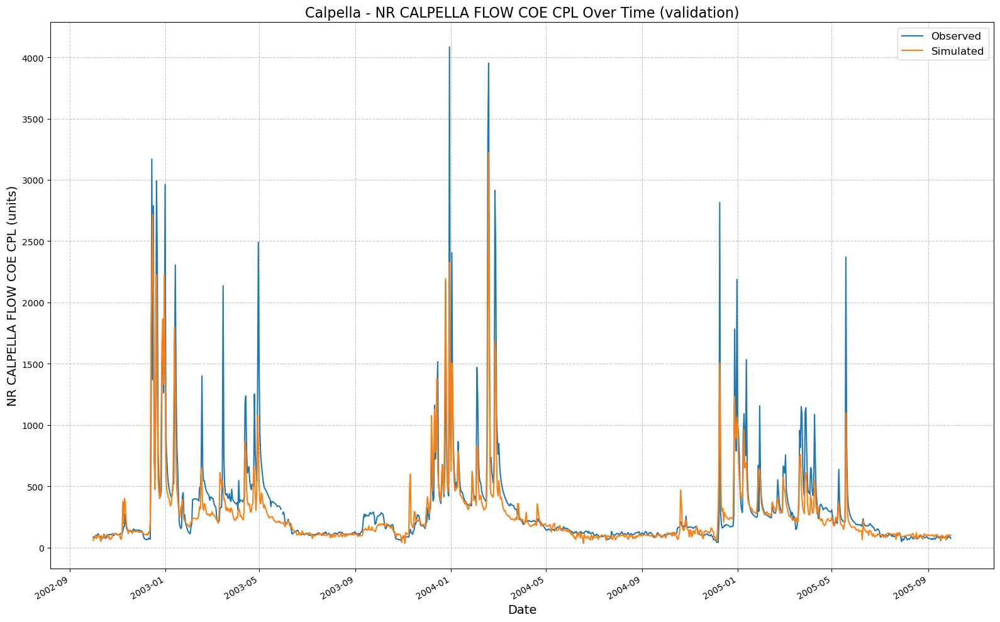

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203217\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7534262239933014, 'MSE': 42240.6171875, 'RMSE': 205.52522275258576, 'KGE': 0.6791542953245098, 'Alpha-NSE': 0.744196705133856, 'Beta-KGE': 0.8419139981269836, 'Beta-NSE': -0.12094705761171531, 'Pearson-r': 0.8881274986596743, 'FHV': -25.96951425075531, 'FMS': -8.952359838146853, 'FLV': -24.364368693563254, 'Peak-Timing': 0.4, 'Peak-MAPE': 48.27664375305176}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:34:14,252: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203414\output.log initialized.
2025-02-12 20:34:14,254: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203414
2025-02-12 20:34:14,254

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:34:14,399: Loading basin data into xarray data set.
100%|██████████| 1/1 [00:00<00:00,  4.29it/s]
2025-02-12 20:34:14,649: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.10it/s]
2025-02-12 20:34:14,674: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.57it/s, Loss: 0.0000]
2025-02-12 20:34:22,064: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.57it/s, Loss: 0.0000]
2025-02-12 20:34:29,083: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Loss: 0.0000]
2025-02-12 20:34:36,794: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 20:34:44,131: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
2025-02-12 20:38:16,220: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203414\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:38:16,223: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203414\validation\model_epoch032\validation_results.p
got predictions


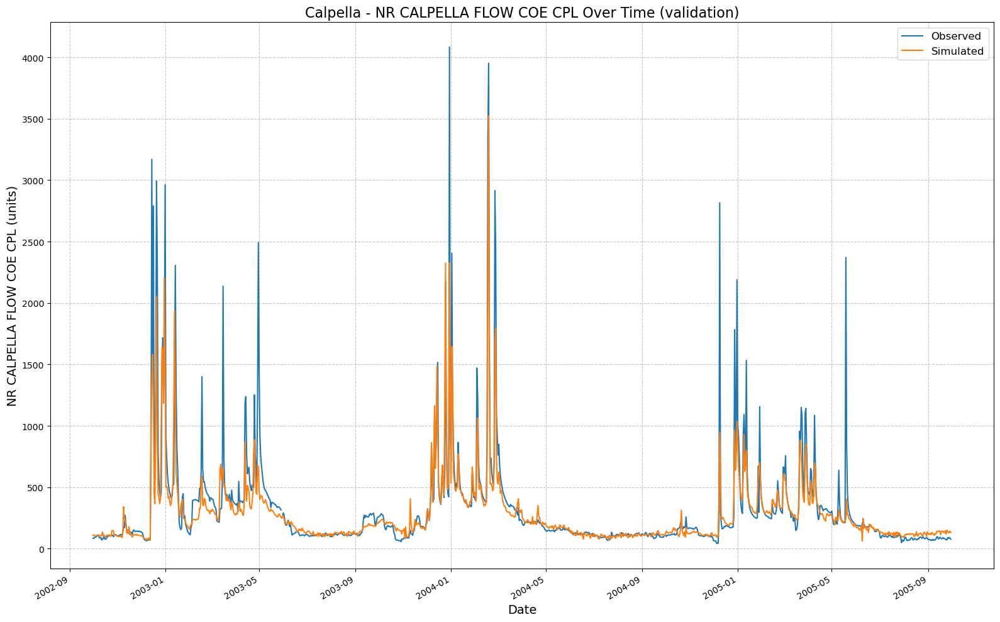

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203414\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7404194474220276, 'MSE': 44468.81640625, 'RMSE': 210.87630593845768, 'KGE': 0.6528118459014247, 'Alpha-NSE': 0.6922702759377032, 'Beta-KGE': 0.886279821395874, 'Beta-NSE': -0.08700404068437258, 'Pearson-r': 0.8863789092942493, 'FHV': -31.73595368862152, 'FMS': -14.691221084315597, 'FLV': 29.21735317114954, 'Peak-Timing': 0.6, 'Peak-MAPE': 65.91357231140137}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:38:16,970: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203816\output.log initialized.
2025-02-12 20:38:16,970: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203816
2025-02-12 20:38:16,970

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.45it/s]
2025-02-12 20:38:17,376: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.71it/s]
2025-02-12 20:38:17,390: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 20:38:25,038: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Loss: 0.0000]
2025-02-12 20:38:32,200: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 20:38:39,538: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 20:38:46,856: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 20:38:54,165: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]
2025-02-12 20:40:18,295: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203816\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:40:18,298: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203816\validation\model_epoch016\validation_results.p
got predictions


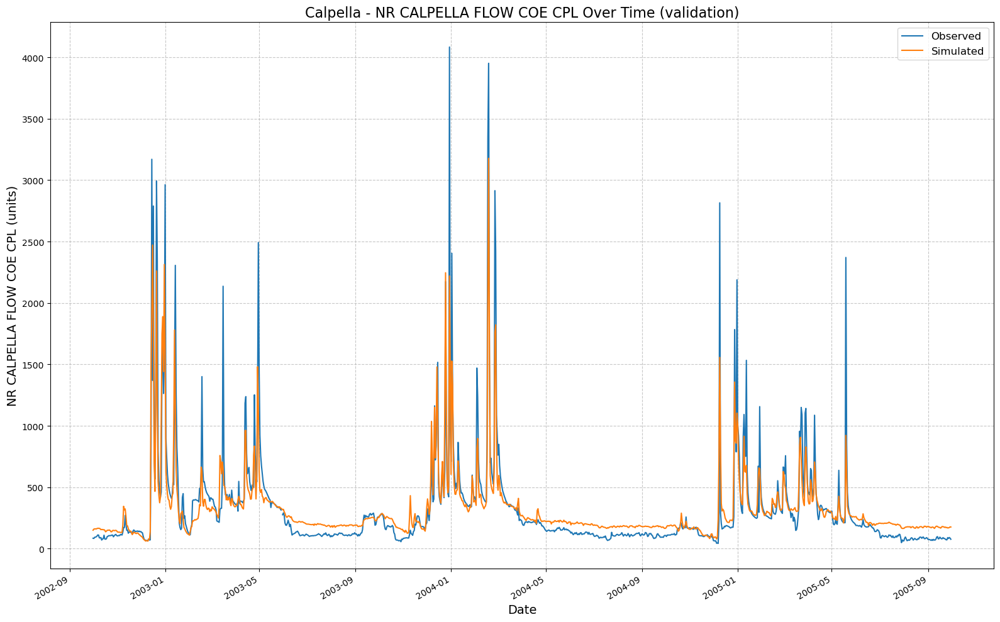

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_203816\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.778334379196167, 'MSE': 37973.59765625, 'RMSE': 194.86815454622132, 'KGE': 0.6950516496450518, 'Alpha-NSE': 0.7114177020050944, 'Beta-KGE': 1.016620397567749, 'Beta-NSE': 0.012715746606428258, 'Pearson-r': 0.9028531212396729, 'FHV': -26.13072693347931, 'FMS': -43.454181776081626, 'FLV': -18.815010031964004, 'Peak-Timing': 0.4, 'Peak-MAPE': 48.78115653991699}
Approach: NoPhysics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:40:19,102: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204019\output.log initialized.
2025-02-12 20:40:19,118: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204019
2025-02-12 20:40:19,11

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  3.60it/s]
2025-02-12 20:40:19,507: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 334.71it/s]
2025-02-12 20:40:19,529: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:06<00:00,  1.58it/s, Loss: 0.0000]
2025-02-12 20:40:26,820: Epoch 1 average loss: avg_loss: 0.00001, avg_total_loss: 0.00001
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Loss: 0.0000]
2025-02-12 20:40:33,911: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:06<00:00,  1.58it/s, Loss: 0.0000]
2025-02-12 20:40:40,903: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.56it/s, Loss: 0.0000]
2025-02-12 20:40:47,960: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00,  1.56it/s, Loss: 0.0000]
2025-02-12 20:40:55,018: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]
2025-02-12 20:44:17,080: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204019\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:44:17,083: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204019\validation\model_epoch032\validation_results.p
got predictions


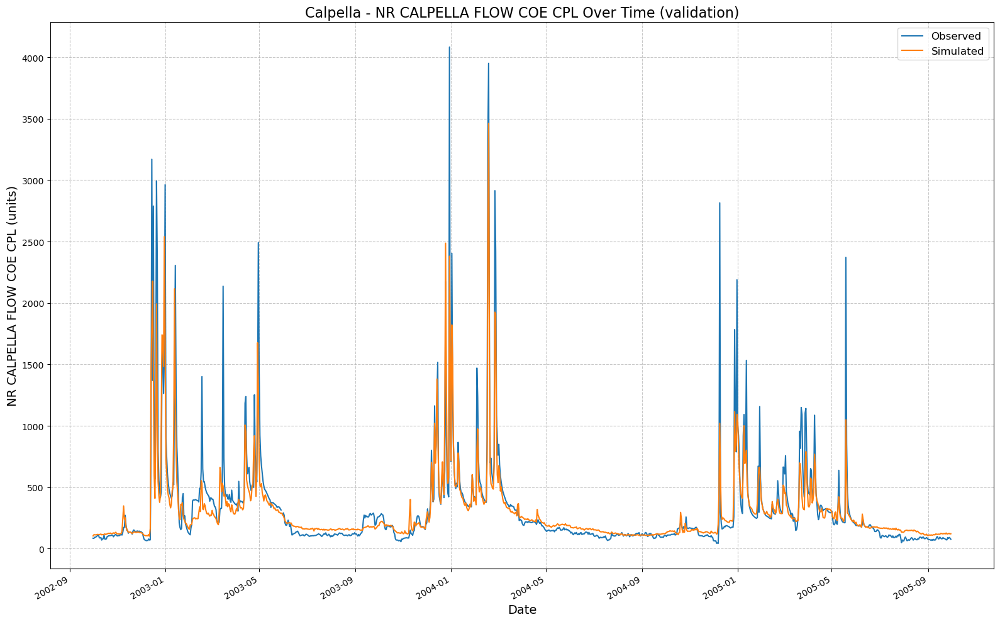

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204019\results_output_validation.csv
NoPhysics metrics: {'NSE': 0.7876735776662827, 'MSE': 36373.6953125, 'RMSE': 190.7188908118438, 'KGE': 0.7217845935818278, 'Alpha-NSE': 0.7458635003407176, 'Beta-KGE': 0.9428920149803162, 'Beta-NSE': -0.04369169700633081, 'Pearson-r': 0.9022394253477004, 'FHV': -23.759271204471588, 'FMS': -30.300108307449193, 'FLV': 72.21430650771788, 'Peak-Timing': 0.4, 'Peak-MAPE': 50.42421817779541}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:44:17,922: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204417\output.log initialized.
2025-02-12 20:44:17,922: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204417
2025-02-12 20:44:17,930: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:44:17,995: log_interval: 16
2025-02-12 20:44:17,997: log_tensorboard: True
2025-02-12 20:44:17,998: log_n_figures: 1
2025-02-12 20:44:18,000: save_weights_every: 16
2025-02-12 20:44:18,001: dataset: russian_river
2025-02-12 20:44:18,002: data_dir: F:\Dino\UCB-USACE-LSTMs\russian_river_data
2025-02-12 20:44:18,004: dynamic_inputs: ['EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'EF RUSSIAN 20 PRECIP-INC SCREENED', 'POTTER VALLEY CA FLOW USGS_ADJUSTED', 'UKIAH CA HUMIDITY USAF-NOAA', 'UKIAH CA SOLAR RADIATION USAF-NOAA', 'UKIAH CA TEMPERATURE USAF-NOAA', 'UKIAH CA WINDSPEED USAF-NOAA', 'Capella Gage FLOW', 'EF Russian 20 ET-POTENTIAL', 'EF Russian 20 FLOW', 'EF Russian 20 FLOW-BASE', 'EF Russian 20 INFILTRATION', 'EF Russian 20 PERC-SOIL', 'EF Russian 20 SATURATION FRACTION']
2025-02-12 20:44:18,005: target_variables: ['NR CALPELLA FLOW COE CPL']
2025-02-12 20:44:18,007: clip_targets_to_zero: [['NR CALPELLA FLOW COE CPL']]
2025-02-12 20:44:18,009: hourly: False
2025-

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]
2025-02-12 20:44:39,694: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204417\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:44:39,697: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204417\validation\model_epoch016\validation_results.p
got predictions


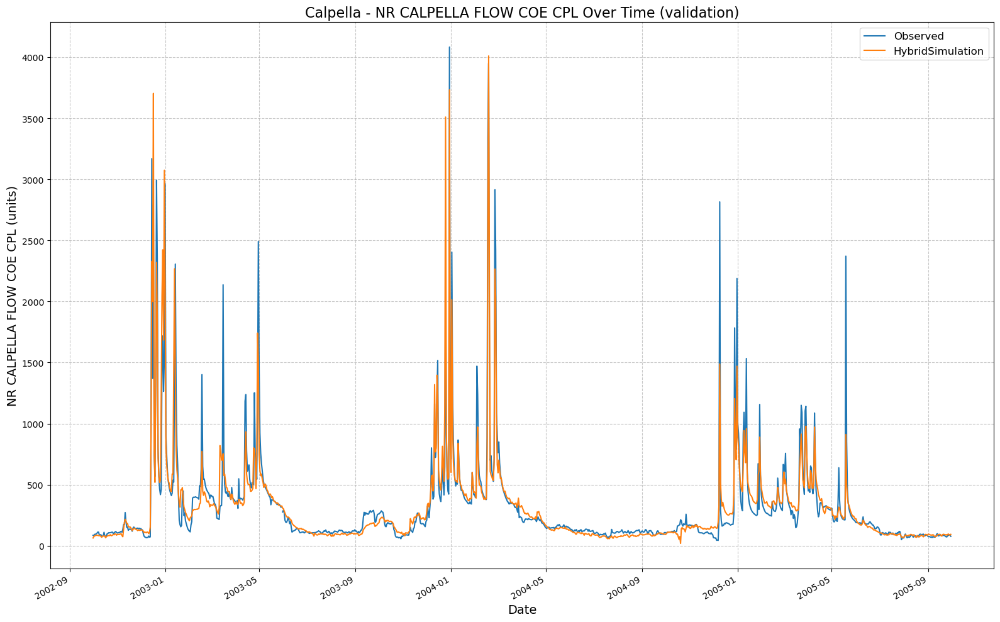

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204417\results_output_validation.csv
Physics metrics: {'NSE': 0.8450226038694382, 'MSE': 26549.220703125, 'RMSE': 162.93931601404554, 'KGE': 0.8918064638454244, 'Alpha-NSE': 0.930439871428346, 'Beta-KGE': 0.9805881381034851, 'Beta-NSE': -0.01485148003834676, 'Pearson-r': 0.9194369228713485, 'FHV': -6.41670748591423, 'FMS': 12.74548091532883, 'FLV': -95.96773291895737, 'Peak-Timing': 0.2, 'Peak-MAPE': 36.606597900390625}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:44:40,419: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204440\output.log initialized.
2025-02-12 20:44:40,419: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204440
2025-02-12 20:44:40,419: ### 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]
2025-02-12 20:44:41,050: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 217.76it/s]
2025-02-12 20:44:41,077: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  9.94it/s, Loss: 0.0000]
2025-02-12 20:44:42,590: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 11.04it/s, Loss: 0.0000]
2025-02-12 20:44:43,595: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 11.25it/s, Loss: 0.0000]
2025-02-12 20:44:44,580: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 11.24it/s, Loss: 0.0000]
2025-02-12 20:44:45,566: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 11.18it/s, Loss: 0.0000]
2025-02-12 20:44:46,559: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]
2025-02-12 20:45:18,466: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204440\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:45:18,469: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204440\validation\model_epoch032\validation_results.p
got predictions


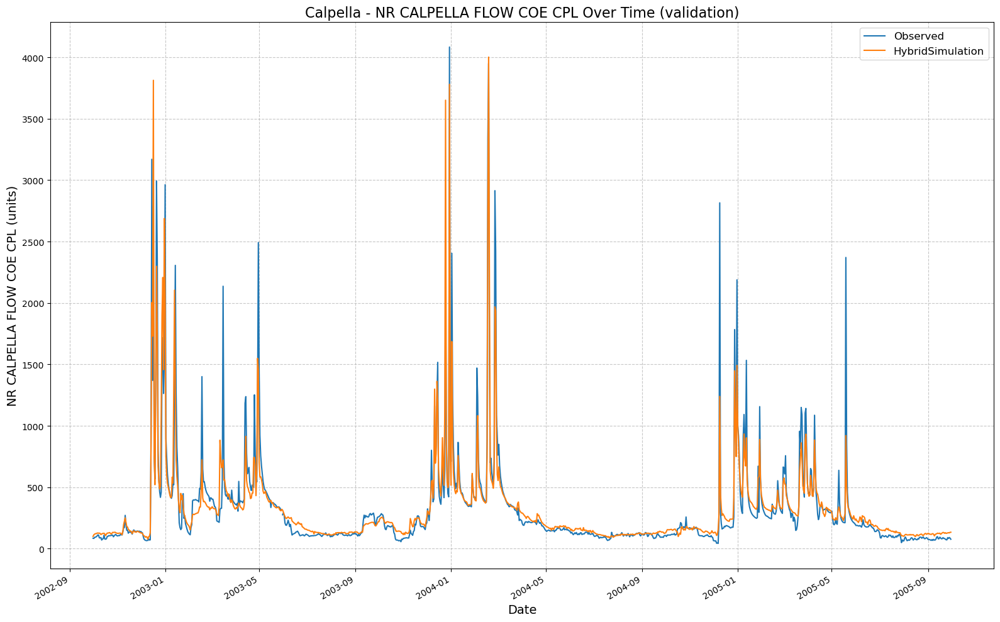

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204440\results_output_validation.csv
Physics metrics: {'NSE': 0.8409547209739685, 'MSE': 27246.08984375, 'RMSE': 165.06389624551457, 'KGE': 0.8527470910396493, 'Alpha-NSE': 0.8777520812083034, 'Beta-KGE': 1.0009738206863403, 'Beta-NSE': 0.0007450661578932699, 'Pearson-r': 0.9179151827579854, 'FHV': -10.540630668401718, 'FMS': -15.439145509595006, 'FLV': 42.61493878355851, 'Peak-Timing': 0.2, 'Peak-MAPE': 40.52720546722412}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:45:19,329: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204519\output.log initialized.
2025-02-12 20:45:19,329: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204519
2025-02-12 20:45:19,329: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.34it/s]
2025-02-12 20:45:19,894: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 202.96it/s]
2025-02-12 20:45:19,928: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00, 10.78it/s, Loss: 0.0000]
2025-02-12 20:45:21,394: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:00<00:00, 12.17it/s, Loss: 0.0000]
2025-02-12 20:45:22,304: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:00<00:00, 12.19it/s, Loss: 0.0000]
2025-02-12 20:45:23,213: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:00<00:00, 12.19it/s, Loss: 0.0000]
2025-02-12 20:45:24,124: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:00<00:00, 11.94it/s, Loss: 0.0000]
2025-02-12 20:45:25,051: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]
2025-02-12 20:45:38,470: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204519\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:45:38,474: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204519\validation\model_epoch016\validation_results.p
got predictions


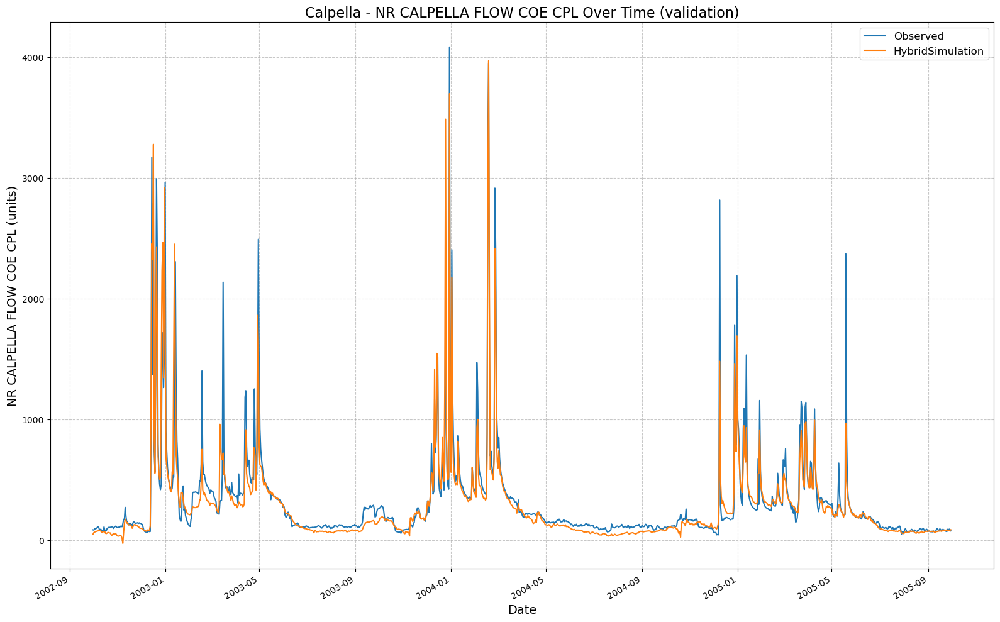

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204519\results_output_validation.csv
Physics metrics: {'NSE': 0.8414338231086731, 'MSE': 27164.015625, 'RMSE': 164.81509525829242, 'KGE': 0.8668734336699946, 'Alpha-NSE': 0.9494301736973729, 'Beta-KGE': 0.9058915972709656, 'Beta-NSE': -0.07199963959590502, 'Pearson-r': 0.9205708877908778, 'FHV': -5.051888152956963, 'FMS': 21.272804471673027, 'FLV': -2195.997706262563, 'Peak-Timing': 0.2, 'Peak-MAPE': 34.520418643951416}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:45:39,663: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204539\output.log initialized.
2025-02-12 20:45:39,663: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204539
2025-02-12 20:45:39,673: ### 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]
2025-02-12 20:45:40,309: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-02-12 20:45:40,349: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.89it/s, Loss: 0.0000]
2025-02-12 20:45:41,924: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.92it/s, Loss: 0.0000]
2025-02-12 20:45:43,038: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.81it/s, Loss: 0.0000]
2025-02-12 20:45:44,166: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.75it/s, Loss: 0.0000]
2025-02-12 20:45:45,303: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.68it/s, Loss: 0.0000]
2025-02-12 20:45:46,448: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]
2025-02-12 20:46:21,215: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204539\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:46:21,218: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204539\validation\model_epoch032\validation_results.p
got predictions


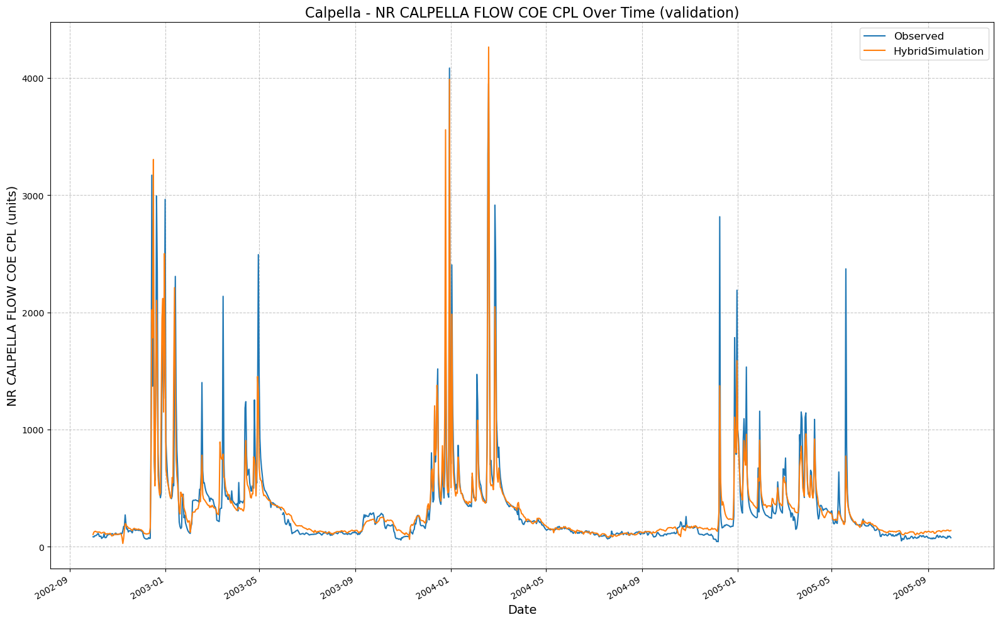

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204539\results_output_validation.csv
Physics metrics: {'NSE': 0.8369452804327011, 'MSE': 27932.94921875, 'RMSE': 167.13153268832903, 'KGE': 0.8467450728122361, 'Alpha-NSE': 0.8718802520528213, 'Beta-KGE': 0.99921715259552, 'Beta-NSE': -0.0005989284909022298, 'Pearson-r': 0.9159060641709553, 'FHV': -11.94142997264862, 'FMS': -12.829404552714538, 'FLV': -82.12533584071504, 'Peak-Timing': 0.2, 'Peak-MAPE': 40.81856727600098}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:46:22,081: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204622\output.log initialized.
2025-02-12 20:46:22,083: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204622
2025-02-12 20:46:22,083: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.09it/s]
2025-02-12 20:46:22,669: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<?, ?it/s]
2025-02-12 20:46:22,683: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.73it/s, Loss: 0.0000]
2025-02-12 20:46:25,354: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.88it/s, Loss: 0.0000]
2025-02-12 20:46:27,619: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.76it/s, Loss: 0.0000]
2025-02-12 20:46:29,952: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.84it/s, Loss: 0.0000]
2025-02-12 20:46:32,248: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.76it/s, Loss: 0.0000]
2025-02-12 20:46:34,575: Epoch 5 average loss: a

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]
2025-02-12 20:47:03,879: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204622\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:47:03,882: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204622\validation\model_epoch016\validation_results.p
got predictions


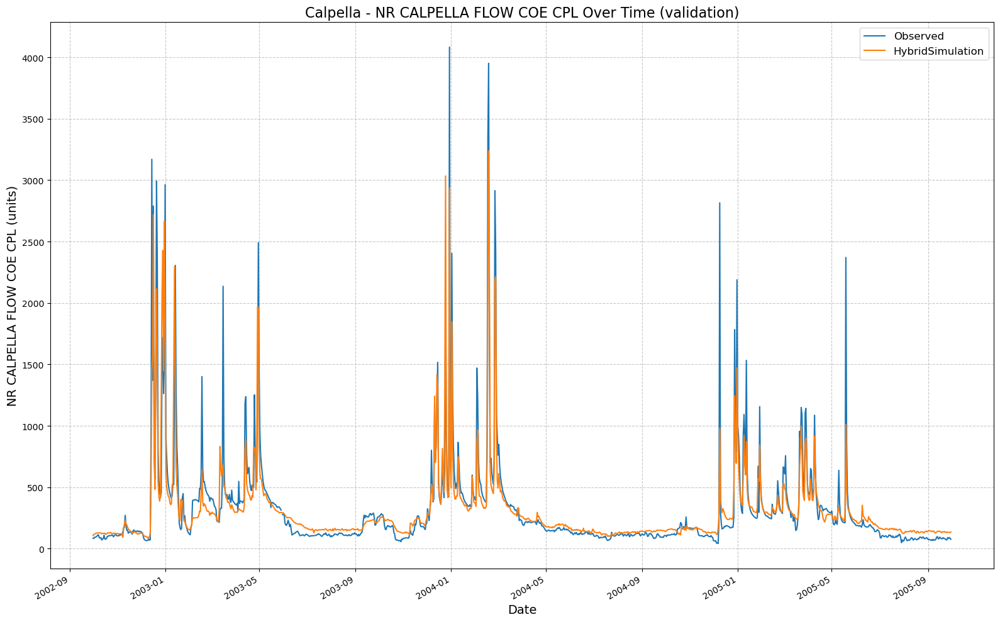

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204622\results_output_validation.csv
Physics metrics: {'NSE': 0.8149707019329071, 'MSE': 31697.41796875, 'RMSE': 178.03768693383432, 'KGE': 0.7799056024426215, 'Alpha-NSE': 0.8016790937754055, 'Beta-KGE': 0.9697776436805725, 'Beta-NSE': -0.023122267384151983, 'Pearson-r': 0.9094628740852544, 'FHV': -15.892039239406586, 'FMS': -30.572377047067118, 'FLV': 42.5406576799086, 'Peak-Timing': 0.6, 'Peak-MAPE': 45.26161193847656}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:47:04,804: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204704\output.log initialized.
2025-02-12 20:47:04,804: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204704
2025-02-12 20:47:04,808: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 20:47:04,869: log_interval: 16
2025-02-12 20:47:04,872: log_tensorboard: True
2025-02-12 20:47:04,875: log_n_figures: 1
2025-02-12 20:47:04,878: save_weights_every: 32
2025-02-12 20:47:04,879: dataset: russian_river
2025-02-12 20:47:04,882: data_dir: F:\Dino\UCB-USACE-LSTMs\russian_river_data
2025-02-12 20:47:04,883: dynamic_inputs: ['EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR', 'EF RUSSIAN 20 PRECIP-INC SCREENED', 'POTTER VALLEY CA FLOW USGS_ADJUSTED', 'UKIAH CA HUMIDITY USAF-NOAA', 'UKIAH CA SOLAR RADIATION USAF-NOAA', 'UKIAH CA TEMPERATURE USAF-NOAA', 'UKIAH CA WINDSPEED USAF-NOAA', 'Capella Gage FLOW', 'EF Russian 20 ET-POTENTIAL', 'EF Russian 20 FLOW', 'EF Russian 20 FLOW-BASE', 'EF Russian 20 INFILTRATION', 'EF Russian 20 PERC-SOIL', 'EF Russian 20 SATURATION FRACTION']
2025-02-12 20:47:04,885: target_variables: ['NR CALPELLA FLOW COE CPL']
2025-02-12 20:47:04,887: clip_targets_to_zero: [['NR CALPELLA FLOW COE CPL']]
2025-02-12 20:47:04,890: hourly: False
2025-

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]
2025-02-12 20:48:29,944: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204704\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:48:29,948: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204704\validation\model_epoch032\validation_results.p
got predictions


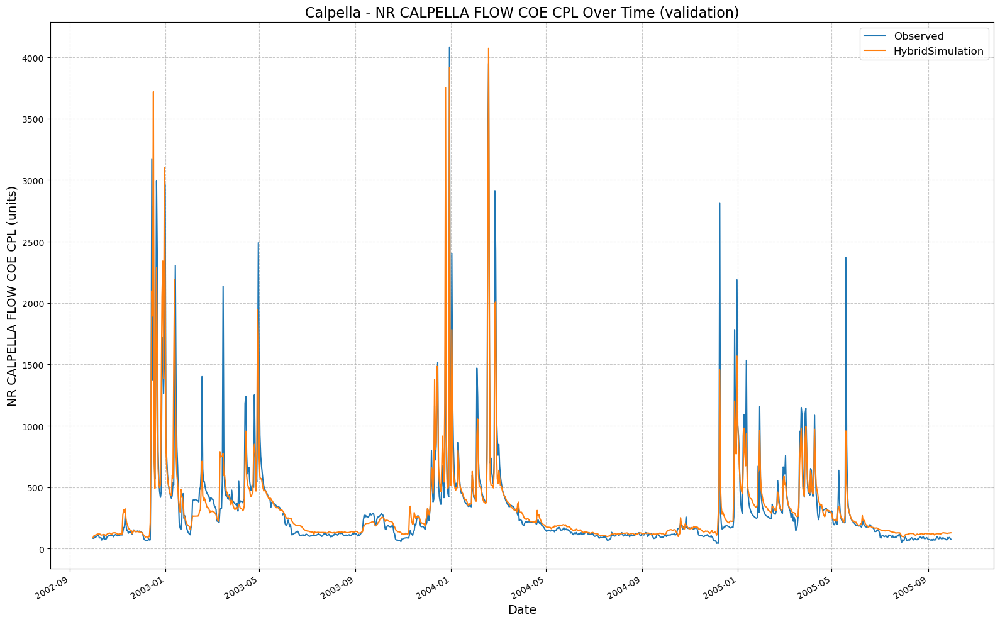

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204704\results_output_validation.csv
Physics metrics: {'NSE': 0.8370880335569382, 'MSE': 27908.4921875, 'RMSE': 167.058349649157, 'KGE': 0.8752220736333021, 'Alpha-NSE': 0.9106922634188221, 'Beta-KGE': 1.0194491147994995, 'Beta-NSE': 0.014879940754521604, 'Pearson-r': 0.9150565421669454, 'FHV': -7.508612424135208, 'FMS': -10.74457468944202, 'FLV': 55.27424988274973, 'Peak-Timing': 0.2, 'Peak-MAPE': 35.252437591552734}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:48:30,646: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204830\output.log initialized.
2025-02-12 20:48:30,646: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204830
2025-02-12 20:48:30,646: ### R

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.16it/s]
2025-02-12 20:48:31,227: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 203.21it/s]
2025-02-12 20:48:31,259: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.72it/s, Loss: 0.0000]
2025-02-12 20:48:34,021: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-12 20:48:36,337: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.88it/s, Loss: 0.0000]
2025-02-12 20:48:38,603: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.88it/s, Loss: 0.0000]
2025-02-12 20:48:40,872: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-12 20:48:43,179: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]
2025-02-12 20:49:15,377: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204830\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:49:15,379: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204830\validation\model_epoch016\validation_results.p
got predictions


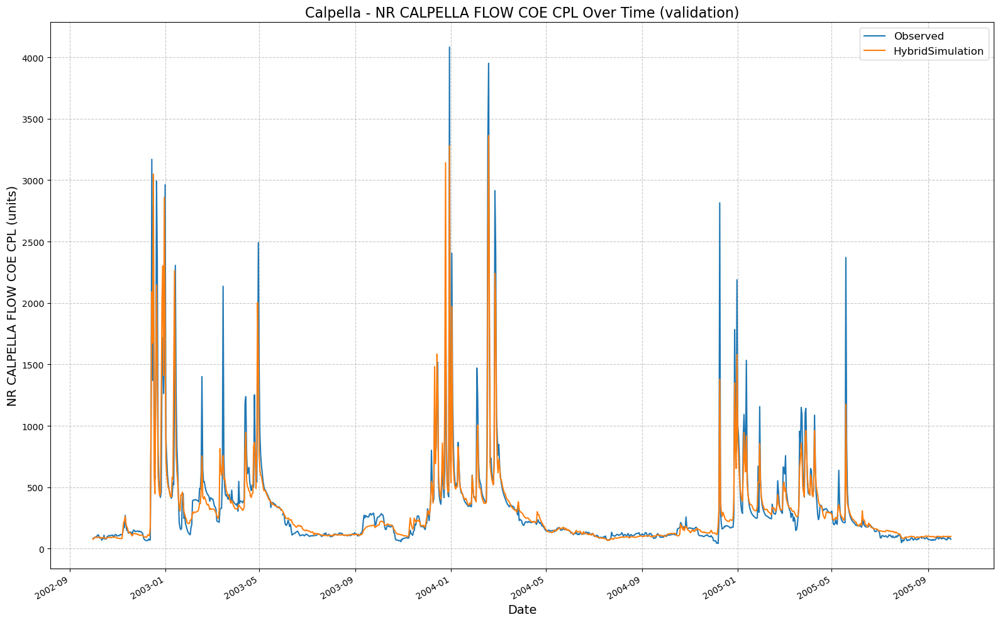

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204830\results_output_validation.csv
Physics metrics: {'NSE': 0.8474649488925934, 'MSE': 26130.8203125, 'RMSE': 161.6503025437936, 'KGE': 0.8322343197903007, 'Alpha-NSE': 0.8543638609660098, 'Beta-KGE': 0.9670499563217163, 'Beta-NSE': -0.02520911621808105, 'Pearson-r': 0.9235164521933341, 'FHV': -13.727368414402008, 'FMS': -5.315870958234635, 'FLV': 48.52751102635333, 'Peak-Timing': 0.2, 'Peak-MAPE': 38.46521615982056}
Approach: Physics | Hyperparams: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:49:16,239: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204916\output.log initialized.
2025-02-12 20:49:16,239: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204916
2025-02-12 20:49:16,239: ### 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.18it/s]
2025-02-12 20:49:16,811: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.90it/s]
2025-02-12 20:49:16,843: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.44it/s, Loss: 0.0000]
2025-02-12 20:49:19,648: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.76it/s, Loss: 0.0000]
2025-02-12 20:49:21,971: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.85it/s, Loss: 0.0000]
2025-02-12 20:49:24,248: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.79it/s, Loss: 0.0000]
2025-02-12 20:49:26,549: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.74it/s, Loss: 0.0000]
2025-02-12 20:49:28,889: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]
2025-02-12 20:50:35,205: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204916\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:50:35,208: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204916\validation\model_epoch032\validation_results.p
got predictions


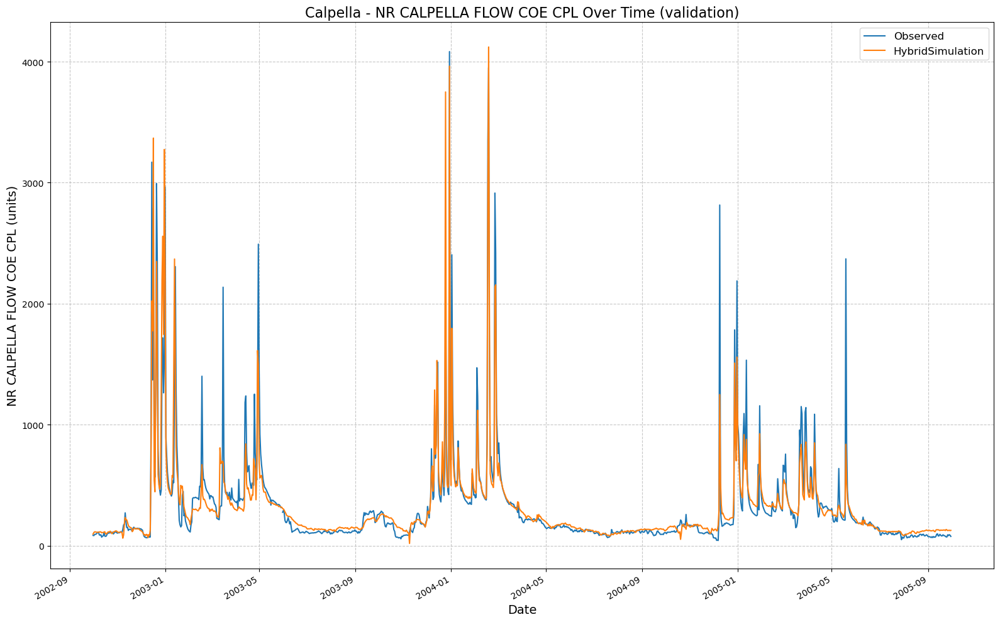

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_204916\results_output_validation.csv
Physics metrics: {'NSE': 0.8266942352056503, 'MSE': 29689.056640625, 'RMSE': 172.30512656512863, 'KGE': 0.8718846322635357, 'Alpha-NSE': 0.91011272655578, 'Beta-KGE': 0.9899978041648865, 'Beta-NSE': -0.007652393494617607, 'Pearson-r': 0.9092598126435176, 'FHV': -6.553404778242111, 'FMS': -16.185630161411364, 'FLV': -133.209755220036, 'Peak-Timing': 0.2, 'Peak-MAPE': 39.84934329986572}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:50:35,986: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205035\output.log initialized.
2025-02-12 20:50:35,996: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205035
2025-02-12 20:50:35,996: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]
2025-02-12 20:50:36,624: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 501.65it/s]
2025-02-12 20:50:36,642: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.64it/s, Loss: 0.0000]
2025-02-12 20:50:38,439: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  9.10it/s, Loss: 0.0000]
2025-02-12 20:50:39,650: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  9.29it/s, Loss: 0.0000]
2025-02-12 20:50:40,841: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  9.58it/s, Loss: 0.0000]
2025-02-12 20:50:41,999: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  9.60it/s, Loss: 0.0000]
2025-02-12 20:50:43,153: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]
2025-02-12 20:51:03,869: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205035\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:51:03,872: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205035\validation\model_epoch016\validation_results.p
got predictions


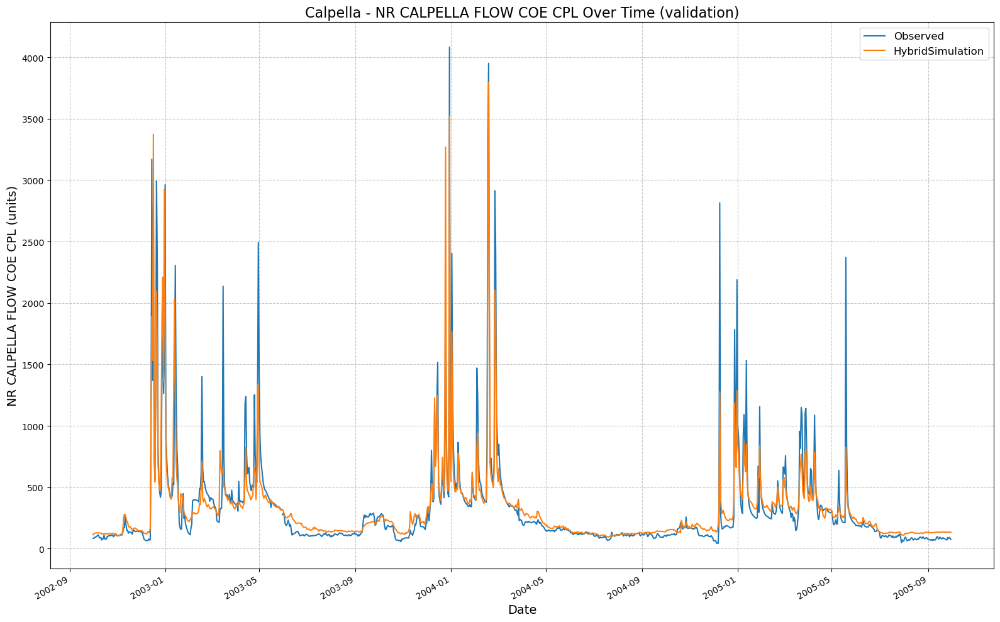

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205035\results_output_validation.csv
Physics metrics: {'NSE': 0.8246937543153763, 'MSE': 30031.76171875, 'RMSE': 173.29674468595766, 'KGE': 0.7983919967948061, 'Alpha-NSE': 0.8181410374476665, 'Beta-KGE': 0.9957190752029419, 'Beta-NSE': -0.0032751943328668035, 'Pearson-r': 0.9130817718849702, 'FHV': -15.590335428714752, 'FMS': -19.545985646620625, 'FLV': 61.798901515409966, 'Peak-Timing': 0.2, 'Peak-MAPE': 44.519243240356445}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:51:04,608: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205104\output.log initialized.
2025-02-12 20:51:04,608: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205104
2025-02-12 20:51:04,60

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.24it/s]
2025-02-12 20:51:05,149: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 191.29it/s]
2025-02-12 20:51:05,182: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  6.46it/s, Loss: 0.0000]
2025-02-12 20:51:07,325: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.52it/s, Loss: 0.0000]
2025-02-12 20:51:08,796: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.46it/s, Loss: 0.0000]
2025-02-12 20:51:10,280: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.58it/s, Loss: 0.0000]
2025-02-12 20:51:11,733: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.67it/s, Loss: 0.0000]
2025-02-12 20:51:13,176: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]
2025-02-12 20:51:57,742: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205104\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:51:57,745: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205104\validation\model_epoch032\validation_results.p
got predictions


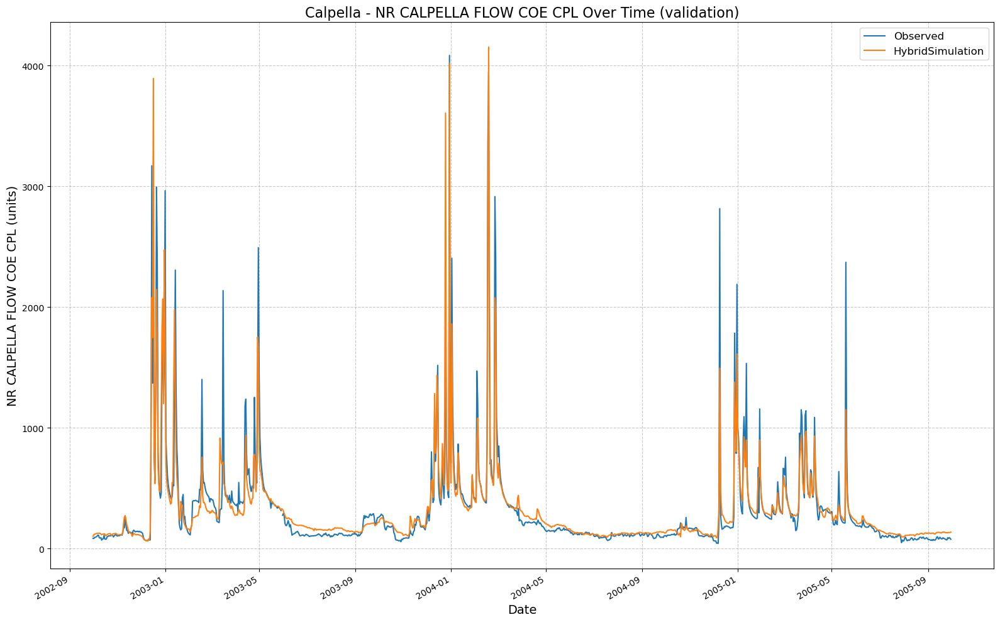

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205104\results_output_validation.csv
Physics metrics: {'NSE': 0.851611852645874, 'MSE': 25420.4140625, 'RMSE': 159.4378062521559, 'KGE': 0.8674101156234623, 'Alpha-NSE': 0.8918068823910305, 'Beta-KGE': 1.0013861656188965, 'Beta-NSE': 0.0010604934734269077, 'Pearson-r': 0.9233683793339047, 'FHV': -10.201642662286758, 'FMS': -17.441036843640745, 'FLV': 15.814724992835997, 'Peak-Timing': 0.2, 'Peak-MAPE': 33.46374750137329}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:51:58,528: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205158\output.log initialized.
2025-02-12 20:51:58,534: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205158
2025-02-12 20:51:58,536: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]
2025-02-12 20:51:59,155: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 502.13it/s]
2025-02-12 20:51:59,178: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.11it/s, Loss: 0.0000]
2025-02-12 20:52:01,090: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.24it/s, Loss: 0.0000]
2025-02-12 20:52:02,438: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.33it/s, Loss: 0.0000]
2025-02-12 20:52:03,765: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.34it/s, Loss: 0.0000]
2025-02-12 20:52:05,090: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.76it/s, Loss: 0.0000]
2025-02-12 20:52:06,354: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]
2025-02-12 20:52:23,891: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205158\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:52:23,895: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205158\validation\model_epoch016\validation_results.p
got predictions


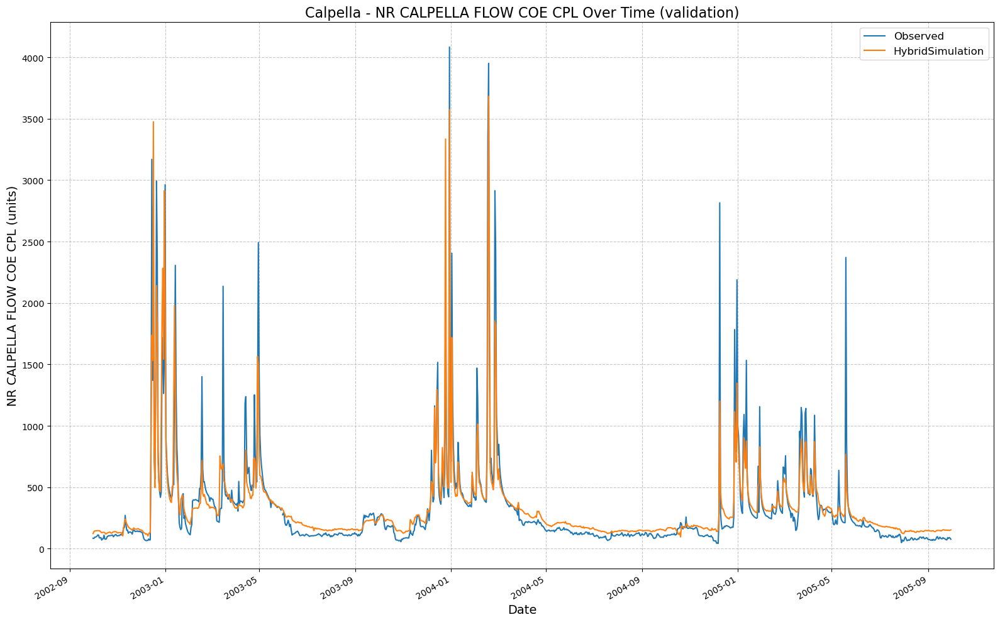

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205158\results_output_validation.csv
Physics metrics: {'NSE': 0.8264327943325043, 'MSE': 29733.845703125, 'RMSE': 172.43504778067884, 'KGE': 0.7970510011875266, 'Alpha-NSE': 0.8198167542779922, 'Beta-KGE': 1.0374500751495361, 'Beta-NSE': 0.028651978086133335, 'Pearson-r': 0.9144442523768159, 'FHV': -14.748010039329529, 'FMS': -26.788766052496342, 'FLV': 47.22683860198771, 'Peak-Timing': 0.2, 'Peak-MAPE': 44.45797920227051}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:52:24,570: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205224\output.log initialized.
2025-02-12 20:52:24,570: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205224
2025-02-12 20:52:24,586: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.24it/s]
2025-02-12 20:52:25,152: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.83it/s]
2025-02-12 20:52:25,172: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.20it/s, Loss: 0.0000]
2025-02-12 20:52:27,090: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.32it/s, Loss: 0.0000]
2025-02-12 20:52:28,422: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.86it/s, Loss: 0.0000]
2025-02-12 20:52:29,672: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.33it/s, Loss: 0.0000]
2025-02-12 20:52:31,000: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.86it/s, Loss: 0.0000]
2025-02-12 20:52:32,248: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]
2025-02-12 20:53:18,481: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205224\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:53:18,484: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205224\validation\model_epoch032\validation_results.p
got predictions


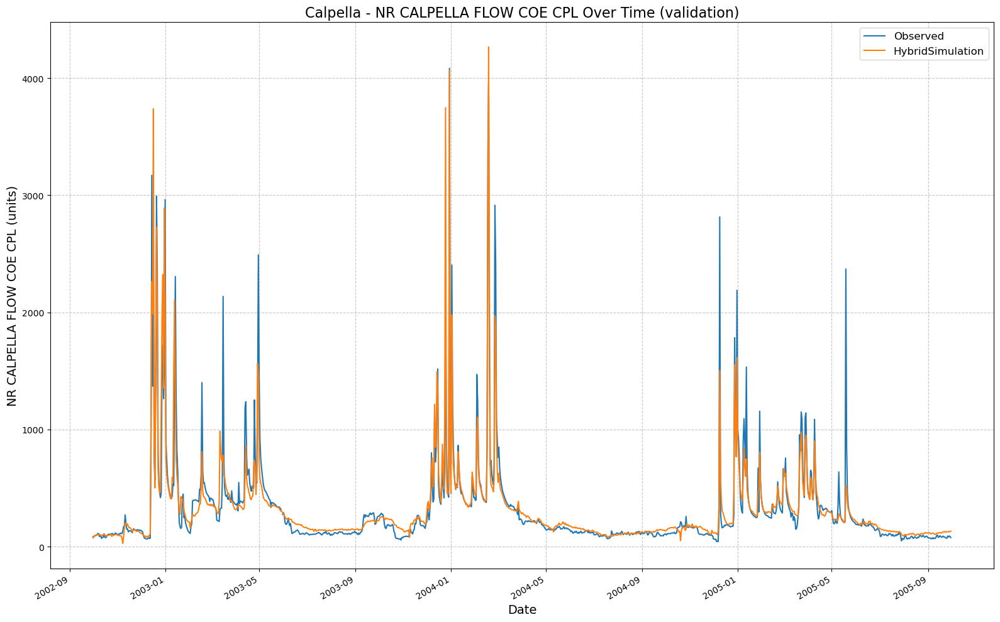

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205224\results_output_validation.csv
Physics metrics: {'NSE': 0.836311548948288, 'MSE': 28041.513671875, 'RMSE': 167.45600518307785, 'KGE': 0.8863252355367099, 'Alpha-NSE': 0.9252757998235436, 'Beta-KGE': 1.006407618522644, 'Beta-NSE': 0.004902247762478955, 'Pearson-r': 0.9145764177253048, 'FHV': -5.60213215649128, 'FMS': -18.540379660230517, 'FLV': -83.25903801317995, 'Peak-Timing': 0.2, 'Peak-MAPE': 38.936238288879395}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:53:19,190: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205319\output.log initialized.
2025-02-12 20:53:19,192: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205319
2025-02-12 20:53:19,196: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.18it/s]
2025-02-12 20:53:19,746: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.59it/s]
2025-02-12 20:53:19,771: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  2.86it/s, Loss: 0.0000]
2025-02-12 20:53:23,982: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.01it/s, Loss: 0.0000]
2025-02-12 20:53:27,641: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.01it/s, Loss: 0.0000]
2025-02-12 20:53:31,299: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  2.92it/s, Loss: 0.0000]
2025-02-12 20:53:35,076: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s, Loss: 0.0000]
2025-02-12 20:53:38,789: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]
2025-02-12 20:54:25,091: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205319\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:54:25,094: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205319\validation\model_epoch016\validation_results.p
got predictions


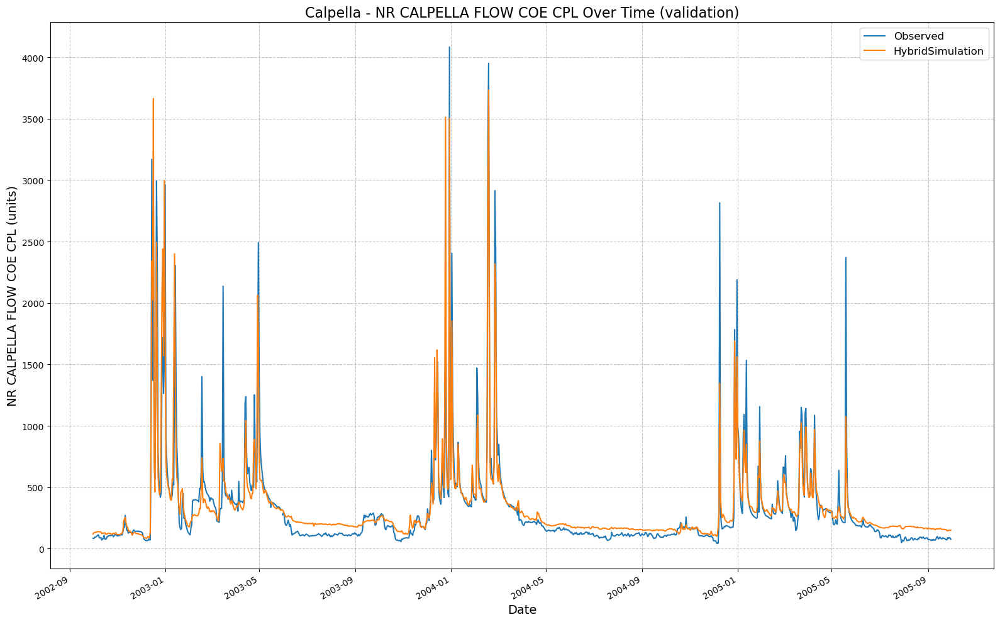

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205319\results_output_validation.csv
Physics metrics: {'NSE': 0.8358484506607056, 'MSE': 28120.845703125, 'RMSE': 167.6927121348003, 'KGE': 0.8532435998570048, 'Alpha-NSE': 0.8934741199924439, 'Beta-KGE': 1.0552018880844116, 'Beta-NSE': 0.042233417098283994, 'Pearson-r': 0.9154871049870923, 'FHV': -6.457158178091049, 'FMS': -33.08099286255596, 'FLV': 27.2269625116273, 'Peak-Timing': 0.2, 'Peak-MAPE': 35.28714179992676}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:54:25,840: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205425\output.log initialized.
2025-02-12 20:54:25,840: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205425
2025-02-12 20:54:25,846: ###

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]
2025-02-12 20:54:26,472: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 334.71it/s]
2025-02-12 20:54:26,491: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  2.93it/s, Loss: 0.0000]
2025-02-12 20:54:30,636: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.06it/s, Loss: 0.0000]
2025-02-12 20:54:34,244: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  2.96it/s, Loss: 0.0000]
2025-02-12 20:54:37,973: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  2.98it/s, Loss: 0.0000]
2025-02-12 20:54:41,666: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s, Loss: 0.0000]
2025-02-12 20:54:45,375: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]
2025-02-12 20:56:26,472: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205425\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:56:26,474: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205425\validation\model_epoch032\validation_results.p
got predictions


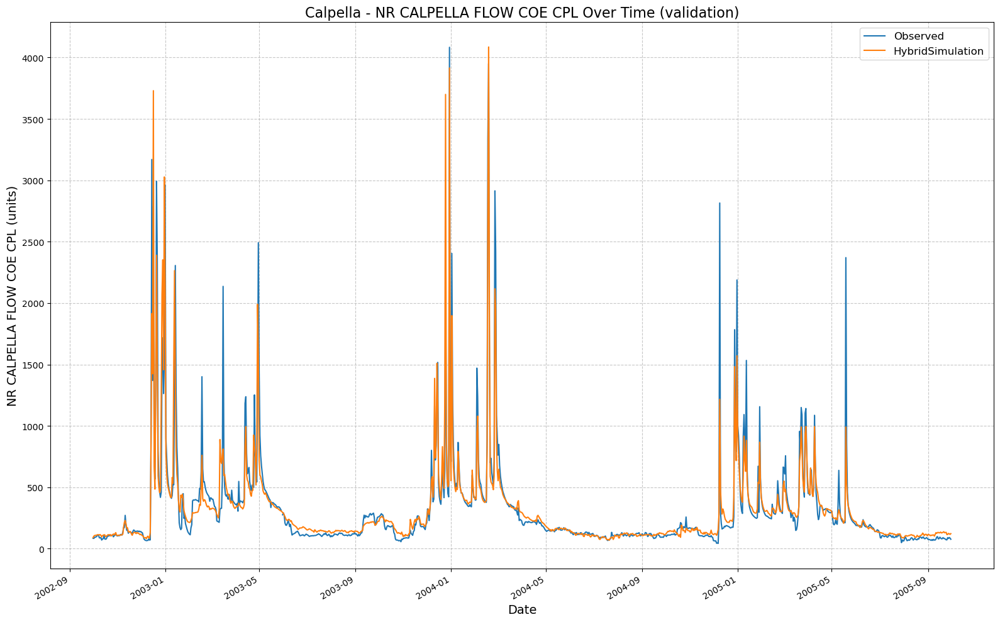

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205425\results_output_validation.csv
Physics metrics: {'NSE': 0.8401893228292465, 'MSE': 27377.208984375, 'RMSE': 165.46059647050413, 'KGE': 0.8768595668626487, 'Alpha-NSE': 0.9096494657274729, 'Beta-KGE': 0.9925652742385864, 'Beta-NSE': -0.005688087951576082, 'Pearson-r': 0.9166629009217626, 'FHV': -8.273625373840332, 'FMS': -12.451880795192551, 'FLV': 38.542867375280416, 'Peak-Timing': 0.2, 'Peak-MAPE': 39.0472936630249}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:56:27,296: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205627\output.log initialized.
2025-02-12 20:56:27,298: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205627
2025-02-12 20:56:27,298:

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]
2025-02-12 20:56:27,966: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 334.37it/s]
2025-02-12 20:56:27,988: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.05it/s, Loss: 0.0000]
2025-02-12 20:56:31,893: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.27it/s, Loss: 0.0000]
2025-02-12 20:56:35,277: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s, Loss: 0.0000]
2025-02-12 20:56:38,646: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s, Loss: 0.0000]
2025-02-12 20:56:42,030: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.22it/s, Loss: 0.0000]
2025-02-12 20:56:45,454: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]
2025-02-12 20:57:33,243: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205627\validation\model_epoch016\validation_metrics.csv
2025-02-12 20:57:33,246: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205627\validation\model_epoch016\validation_results.p
got predictions


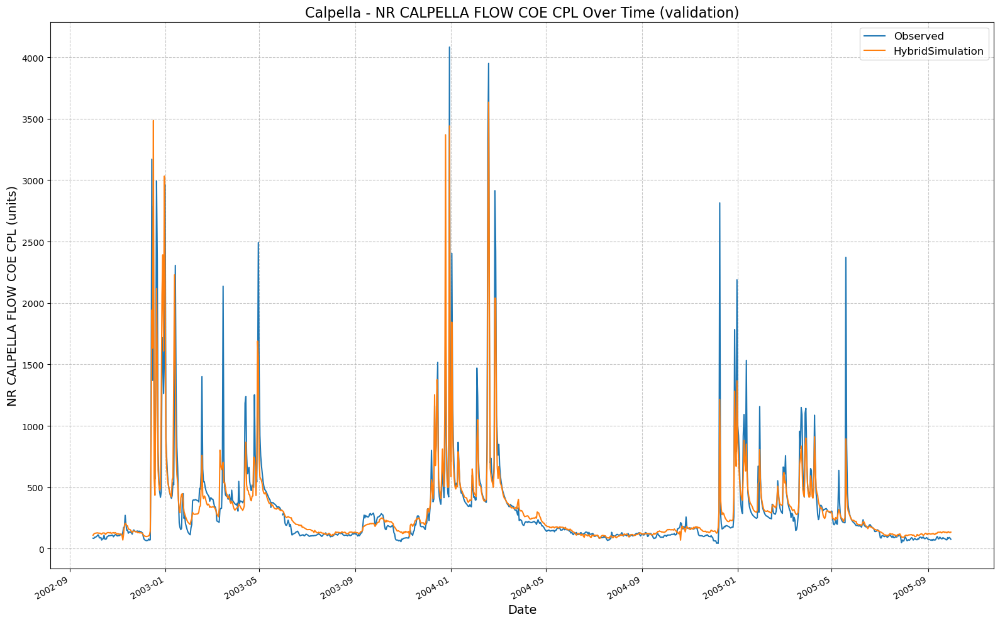

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205627\results_output_validation.csv
Physics metrics: {'NSE': 0.8334362059831619, 'MSE': 28534.0859375, 'RMSE': 168.9203538283649, 'KGE': 0.8305914486136581, 'Alpha-NSE': 0.8539322313481664, 'Beta-KGE': 0.9881362318992615, 'Beta-NSE': -0.009076609022165, 'Pearson-r': 0.9150134407665238, 'FHV': -12.294040620326996, 'FMS': -12.064354400979896, 'FLV': 33.574308715987335, 'Peak-Timing': 0.2, 'Peak-MAPE': 42.231550216674805}
Approach: Physics | Hyperparams: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 20:57:33,960: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205733\output.log initialized.
2025-02-12 20:57:33,961: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205733
2025-02-12 20:57:33,961: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.11it/s]
2025-02-12 20:57:34,529: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.89it/s]
2025-02-12 20:57:34,561: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.05it/s, Loss: 0.0000]
2025-02-12 20:57:38,487: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s, Loss: 0.0000]
2025-02-12 20:57:41,896: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.19it/s, Loss: 0.0000]
2025-02-12 20:57:45,353: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.16it/s, Loss: 0.0000]
2025-02-12 20:57:48,843: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.19it/s, Loss: 0.0000]
2025-02-12 20:57:52,301: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]
2025-02-12 20:59:33,562: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205733\validation\model_epoch032\validation_metrics.csv
2025-02-12 20:59:33,565: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205733\validation\model_epoch032\validation_results.p
got predictions


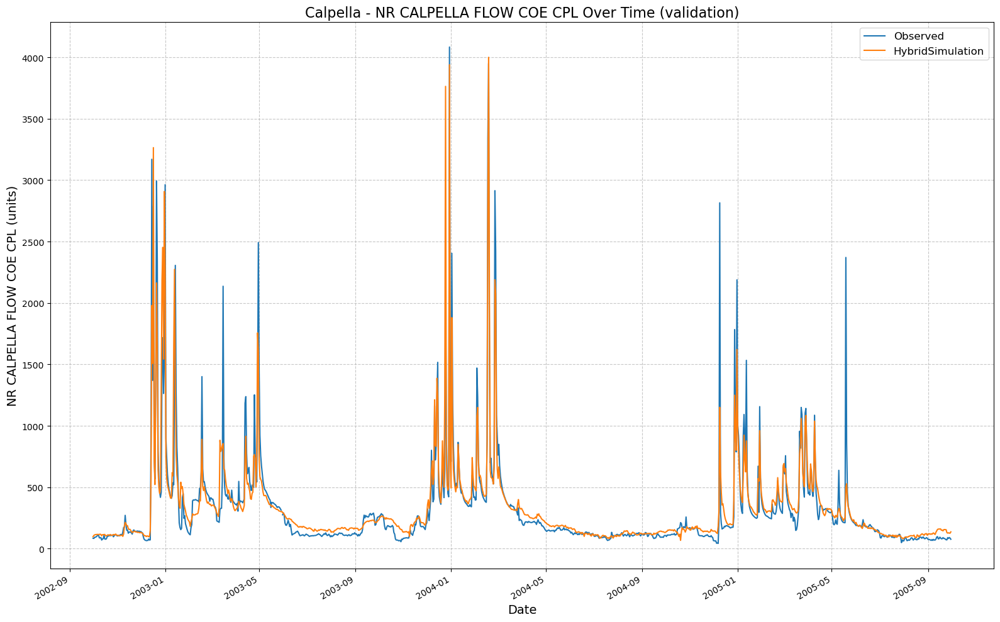

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205733\results_output_validation.csv
Physics metrics: {'NSE': 0.8302060812711716, 'MSE': 29087.44140625, 'RMSE': 170.5504072297982, 'KGE': 0.8669114583830251, 'Alpha-NSE': 0.9065638374601126, 'Beta-KGE': 1.0340203046798706, 'Beta-NSE': 0.02602791480129775, 'Pearson-r': 0.9115417482139638, 'FHV': -7.859780639410019, 'FMS': -15.823716579330874, 'FLV': 28.663730634433005, 'Peak-Timing': 0.4, 'Peak-MAPE': 42.90696144104004}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 20:59:34,358: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205934\output.log initialized.
2025-02-12 20:59:34,360: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205934
2025-02-12 20:59:34,362: ###

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.09it/s]
2025-02-12 20:59:34,950: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 502.31it/s]
2025-02-12 20:59:34,978: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.06it/s, Loss: 0.0000]
2025-02-12 20:59:39,061: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s, Loss: 0.0000]
2025-02-12 20:59:42,766: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  2.94it/s, Loss: 0.0000]
2025-02-12 20:59:46,529: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s, Loss: 0.0000]
2025-02-12 20:59:50,243: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  2.95it/s, Loss: 0.0000]
2025-02-12 20:59:53,986: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]
2025-02-12 21:00:38,930: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205934\validation\model_epoch016\validation_metrics.csv
2025-02-12 21:00:38,932: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205934\validation\model_epoch016\validation_results.p
got predictions


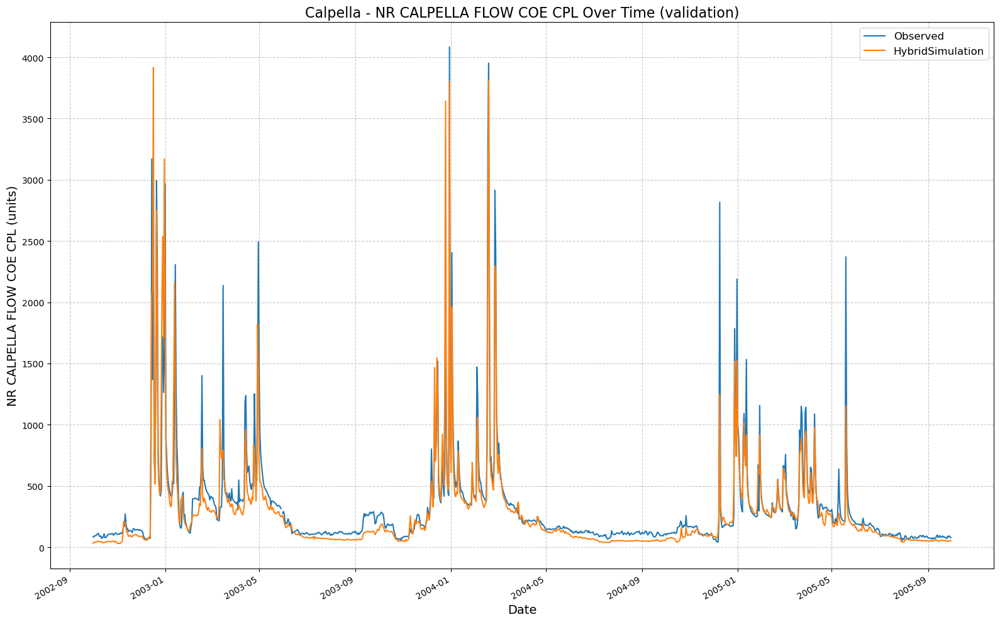

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_205934\results_output_validation.csv
Physics metrics: {'NSE': 0.8295726925134659, 'MSE': 29195.94921875, 'RMSE': 170.86822179314092, 'KGE': 0.8376855281701496, 'Alpha-NSE': 0.9662309915964206, 'Beta-KGE': 0.8640551567077637, 'Beta-NSE': -0.10400747528820899, 'Pearson-r': 0.917996089001246, 'FHV': -4.641254618763924, 'FMS': 22.903310029802412, 'FLV': 24.78740246626915, 'Peak-Timing': 0.6, 'Peak-MAPE': 38.25063705444336}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 21:00:39,590: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210039\output.log initialized.
2025-02-12 21:00:39,606: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210039
2025-02-12 21:00:39,606: ### 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]
2025-02-12 21:00:40,247: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 335.25it/s]
2025-02-12 21:00:40,272: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.14it/s, Loss: 0.0000]
2025-02-12 21:00:44,196: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s, Loss: 0.0000]
2025-02-12 21:00:47,569: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.32it/s, Loss: 0.0000]
2025-02-12 21:00:50,893: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.36it/s, Loss: 0.0000]
2025-02-12 21:00:54,168: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.32it/s, Loss: 0.0000]
2025-02-12 21:00:57,500: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]
2025-02-12 21:02:40,861: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210039\validation\model_epoch032\validation_metrics.csv
2025-02-12 21:02:40,863: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210039\validation\model_epoch032\validation_results.p
got predictions


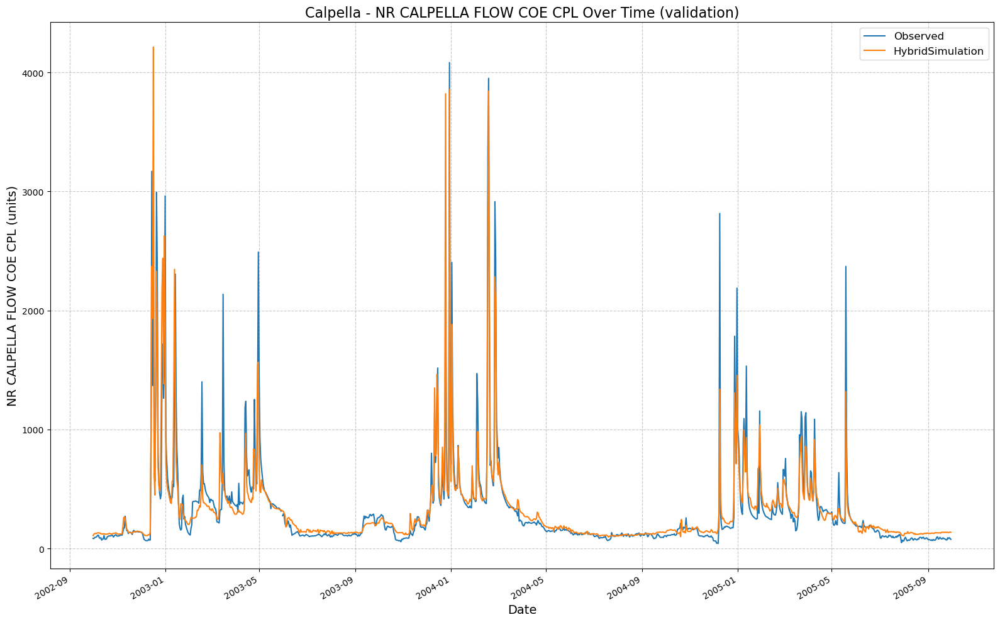

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210039\results_output_validation.csv
Physics metrics: {'NSE': 0.8404468297958374, 'MSE': 27333.09765625, 'RMSE': 165.32724414400064, 'KGE': 0.8803715286093686, 'Alpha-NSE': 0.9145408748234293, 'Beta-KGE': 1.0091389417648315, 'Beta-NSE': 0.006991972160995635, 'Pearson-r': 0.9167882890769974, 'FHV': -6.713118404150009, 'FMS': -13.867784329776722, 'FLV': 66.79089887832328, 'Peak-Timing': 0.0, 'Peak-MAPE': 32.94585943222046}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 21:02:41,570: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210241\output.log initialized.
2025-02-12 21:02:41,570: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210241
2025-02-12 21:02:41,570: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.25it/s]
2025-02-12 21:02:42,112: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 209.43it/s]
2025-02-12 21:02:42,134: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.01it/s, Loss: 0.0000]
2025-02-12 21:02:46,059: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.18it/s, Loss: 0.0000]
2025-02-12 21:02:49,521: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.16it/s, Loss: 0.0000]
2025-02-12 21:02:53,026: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.17it/s, Loss: 0.0000]
2025-02-12 21:02:56,506: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.20it/s, Loss: 0.0000]
2025-02-12 21:02:59,961: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
2025-02-12 21:03:42,695: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210241\validation\model_epoch016\validation_metrics.csv
2025-02-12 21:03:42,698: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210241\validation\model_epoch016\validation_results.p
got predictions


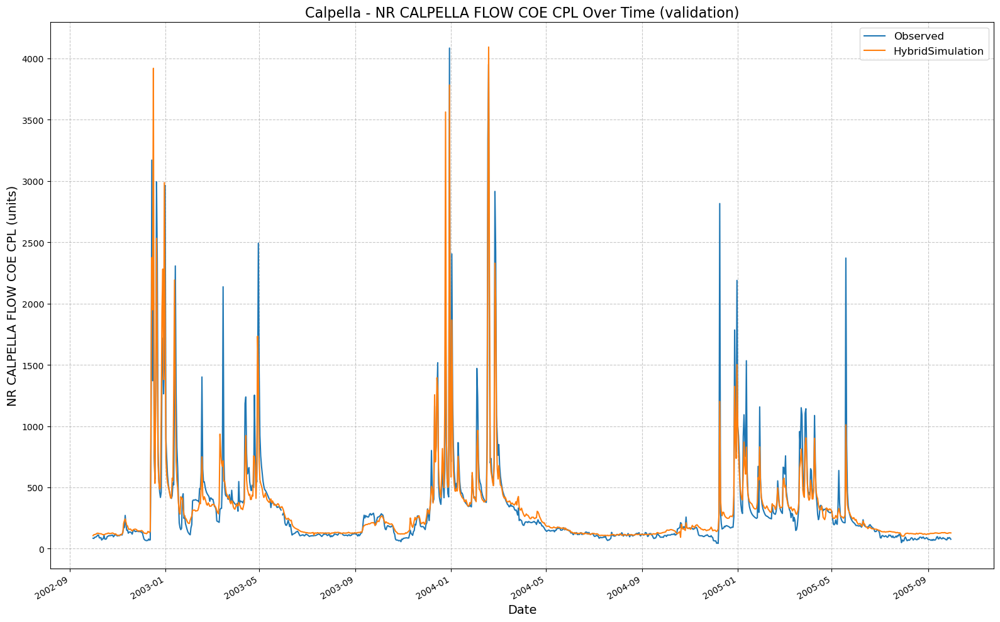

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210241\results_output_validation.csv
Physics metrics: {'NSE': 0.8375425487756729, 'MSE': 27830.630859375, 'RMSE': 166.82515056002498, 'KGE': 0.8698119645607826, 'Alpha-NSE': 0.9013203560332368, 'Beta-KGE': 1.005977988243103, 'Beta-NSE': 0.0045735486103871, 'Pearson-r': 0.9152915819137135, 'FHV': -7.1086883544921875, 'FMS': -12.361175067020366, 'FLV': 65.43550240933556, 'Peak-Timing': 0.2, 'Peak-MAPE': 37.64397621154785}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 21:03:43,496: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210343\output.log initialized.
2025-02-12 21:03:43,496: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210343
2025-02-12 21:03:43,496: ###

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.12it/s]
2025-02-12 21:03:44,087: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 334.26it/s]
2025-02-12 21:03:44,115: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.07it/s, Loss: 0.0000]
2025-02-12 21:03:48,046: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s, Loss: 0.0000]
2025-02-12 21:03:51,428: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s, Loss: 0.0000]
2025-02-12 21:03:54,813: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s, Loss: 0.0000]
2025-02-12 21:03:58,228: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.25it/s, Loss: 0.0000]
2025-02-12 21:04:01,631: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]
2025-02-12 21:05:40,786: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210343\validation\model_epoch032\validation_metrics.csv
2025-02-12 21:05:40,788: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210343\validation\model_epoch032\validation_results.p
got predictions


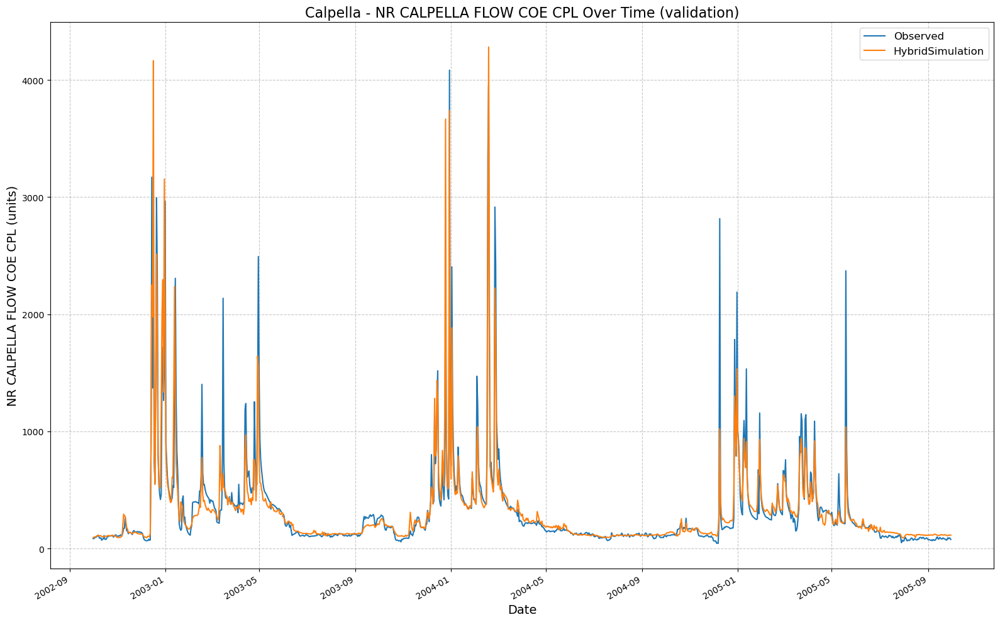

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210343\results_output_validation.csv
Physics metrics: {'NSE': 0.8338290154933929, 'MSE': 28466.798828125, 'RMSE': 168.7210681216931, 'KGE': 0.8833142069844302, 'Alpha-NSE': 0.9239439710249264, 'Beta-KGE': 0.9822490215301514, 'Beta-NSE': -0.01358077542032275, 'Pearson-r': 0.9133053778393485, 'FHV': -6.104395538568497, 'FMS': -9.259827250058827, 'FLV': 72.19804170246248, 'Peak-Timing': 0.2, 'Peak-MAPE': 38.97421836853027}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 21:05:41,512: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210541\output.log initialized.
2025-02-12 21:05:41,512: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210541
2025-02-12 21:05:41,512: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


2025-02-12 21:05:41,609: ### Device cpu will be used for training
2025-02-12 21:05:41,611: Loading basin data into xarray data set.
100%|██████████| 1/1 [00:00<00:00,  2.18it/s]
2025-02-12 21:05:42,102: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.05it/s]
2025-02-12 21:05:42,136: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:08<00:00,  1.37it/s, Loss: 0.0000]
2025-02-12 21:05:50,514: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Loss: 0.0000]
2025-02-12 21:05:58,215: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Loss: 0.0000]
2025-02-12 21:06:05,932: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.44it/s, Loss: 0.0000]
2025-02-12 21:06:13,569: Epoch 4 average loss: avg_loss: 0.00000, avg_

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]
2025-02-12 21:07:48,424: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210541\validation\model_epoch016\validation_metrics.csv
2025-02-12 21:07:48,424: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210541\validation\model_epoch016\validation_results.p
got predictions


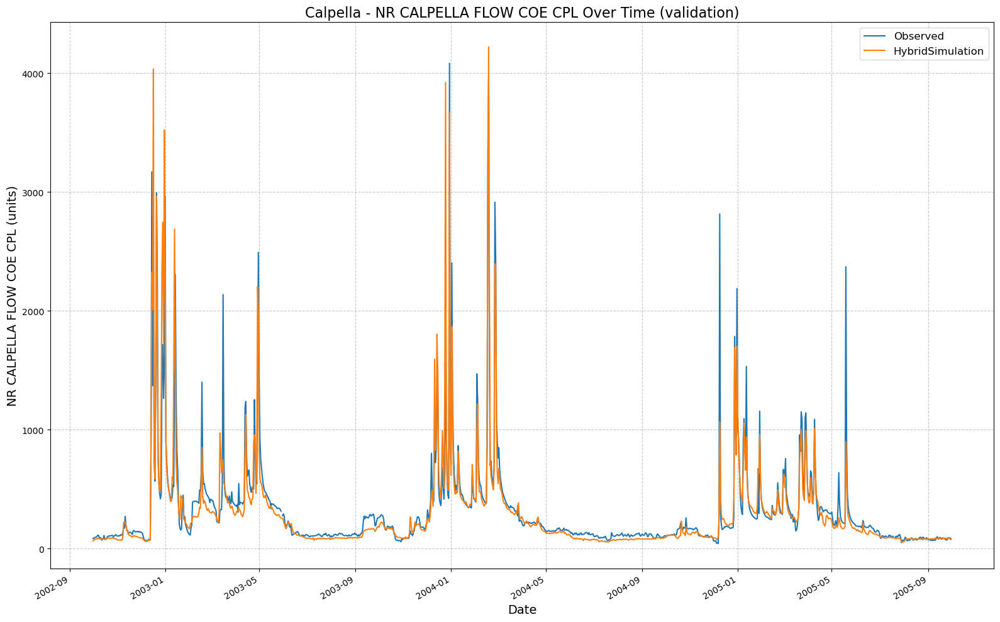

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210541\results_output_validation.csv
Physics metrics: {'NSE': 0.8171796500682831, 'MSE': 31319.001953125, 'RMSE': 176.97175467606405, 'KGE': 0.8871897139259713, 'Alpha-NSE': 1.023996291553936, 'Beta-KGE': 0.9332411885261536, 'Beta-NSE': -0.05107526207821919, 'Pearson-r': 0.9122868326511799, 'FHV': 3.1981561332941055, 'FMS': 13.803108190265478, 'FLV': 52.57242282936967, 'Peak-Timing': 0.2, 'Peak-MAPE': 36.24392509460449}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 21:07:49,215: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210749\output.log initialized.
2025-02-12 21:07:49,215: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210749
2025-02-12 21:07:49,215: ##

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.02it/s]
2025-02-12 21:07:49,826: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 125.57it/s]
2025-02-12 21:07:49,848: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 21:07:57,569: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 21:08:04,882: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 21:08:12,227: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 21:08:19,572: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00,  1.49it/s, Loss: 0.0000]
2025-02-12 21:08:26,968: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]
2025-02-12 21:11:56,604: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210749\validation\model_epoch032\validation_metrics.csv
2025-02-12 21:11:56,606: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210749\validation\model_epoch032\validation_results.p
got predictions


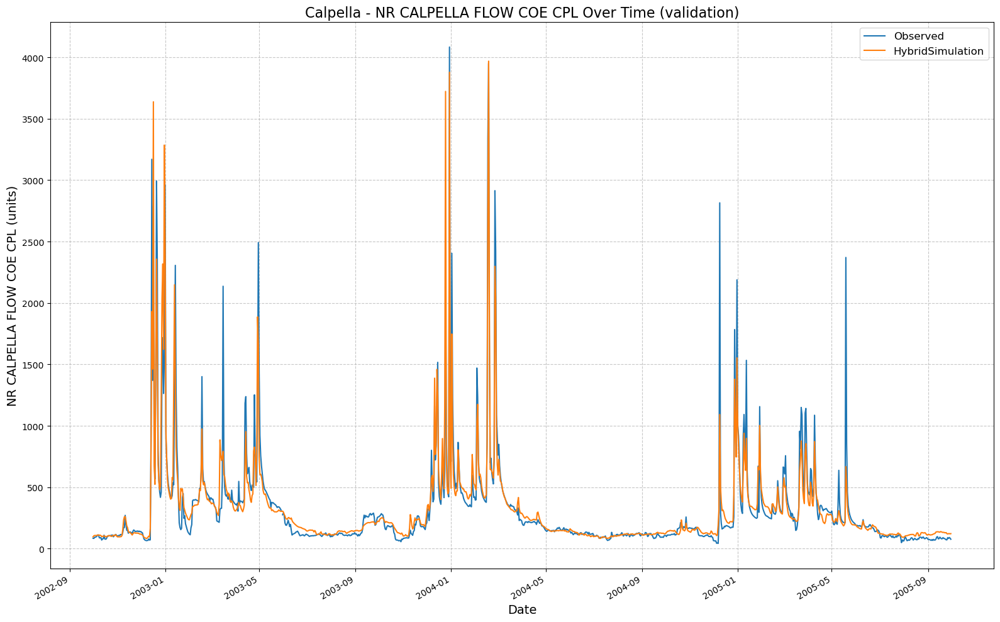

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_210749\results_output_validation.csv
Physics metrics: {'NSE': 0.8347987085580826, 'MSE': 28300.677734375, 'RMSE': 168.2280527568901, 'KGE': 0.8795621954130277, 'Alpha-NSE': 0.9160172191756804, 'Beta-KGE': 0.9993776082992554, 'Beta-NSE': -0.0004761640027387172, 'Pearson-r': 0.9136763651870772, 'FHV': -7.512159645557404, 'FMS': -7.507395612874267, 'FLV': 61.25137530394289, 'Peak-Timing': 0.2, 'Peak-MAPE': 42.04907417297363}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-12 21:11:57,465: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211157\output.log initialized.
2025-02-12 21:11:57,467: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211157
2025-02-12 21:11:57,467: 

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]
2025-02-12 21:11:58,064: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 335.20it/s]
2025-02-12 21:11:58,081: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 21:12:05,745: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Loss: 0.0000]
2025-02-12 21:12:13,114: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.52it/s, Loss: 0.0000]
2025-02-12 21:12:20,378: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.52it/s, Loss: 0.0000]
2025-02-12 21:12:27,608: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Loss: 0.0000]
2025-02-12 21:12:34,905: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]
2025-02-12 21:14:00,898: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211157\validation\model_epoch016\validation_metrics.csv
2025-02-12 21:14:00,900: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211157\validation\model_epoch016\validation_results.p
got predictions


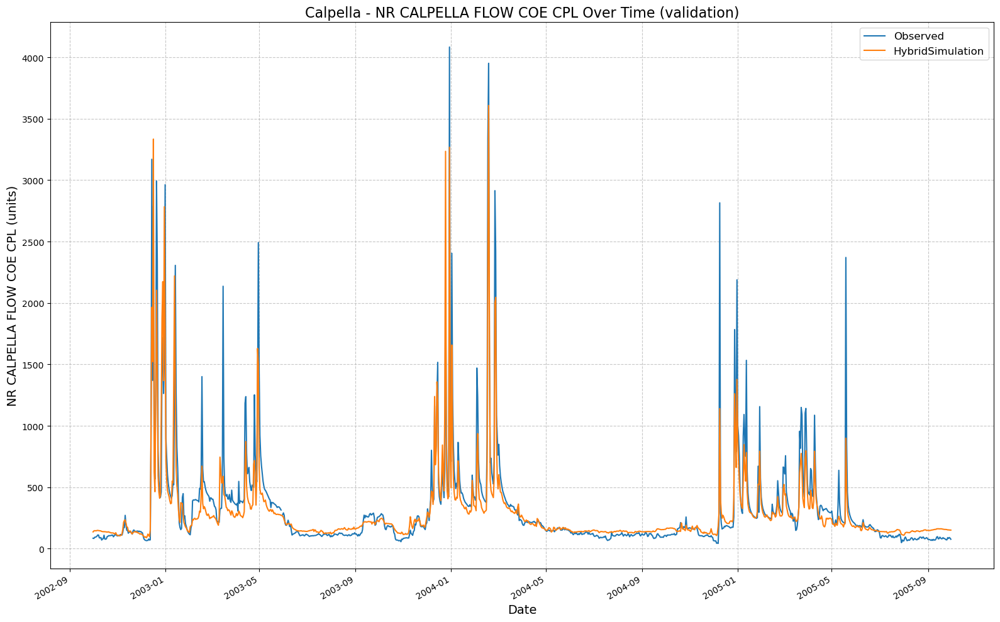

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211157\results_output_validation.csv
Physics metrics: {'NSE': 0.8109554499387741, 'MSE': 32385.271484375, 'RMSE': 179.9590828059951, 'KGE': 0.7614432417268916, 'Alpha-NSE': 0.7977069805583815, 'Beta-KGE': 0.9111365079879761, 'Beta-NSE': -0.06798689981252794, 'Pearson-r': 0.9100547889524062, 'FHV': -16.690078377723694, 'FMS': -36.560963211524445, 'FLV': 47.62581451304022, 'Peak-Timing': 0.2, 'Peak-MAPE': 43.7945556640625}
Approach: Physics | Hyperparams: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-12 21:14:01,652: Logging to F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211401\output.log initialized.
2025-02-12 21:14:01,668: ### Folder structure created at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211401
2025-02-12 21:14:01,668: #

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  2.01it/s]
2025-02-12 21:14:02,290: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.78it/s]
2025-02-12 21:14:02,318: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:07<00:00,  1.40it/s, Loss: 0.0000]
2025-02-12 21:14:10,581: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:07<00:00,  1.45it/s, Loss: 0.0000]
2025-02-12 21:14:18,172: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:07<00:00,  1.45it/s, Loss: 0.0000]
2025-02-12 21:14:25,769: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:07<00:00,  1.46it/s, Loss: 0.0000]
2025-02-12 21:14:33,308: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:07<00:00,  1.42it/s, Loss: 0.0000]
2025-02-12 21:14:41,068: Epoch 5 averag

F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]
2025-02-12 21:18:11,498: Stored metrics at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211401\validation\model_epoch032\validation_metrics.csv
2025-02-12 21:18:11,498: Stored results at F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211401\validation\model_epoch032\validation_results.p
got predictions


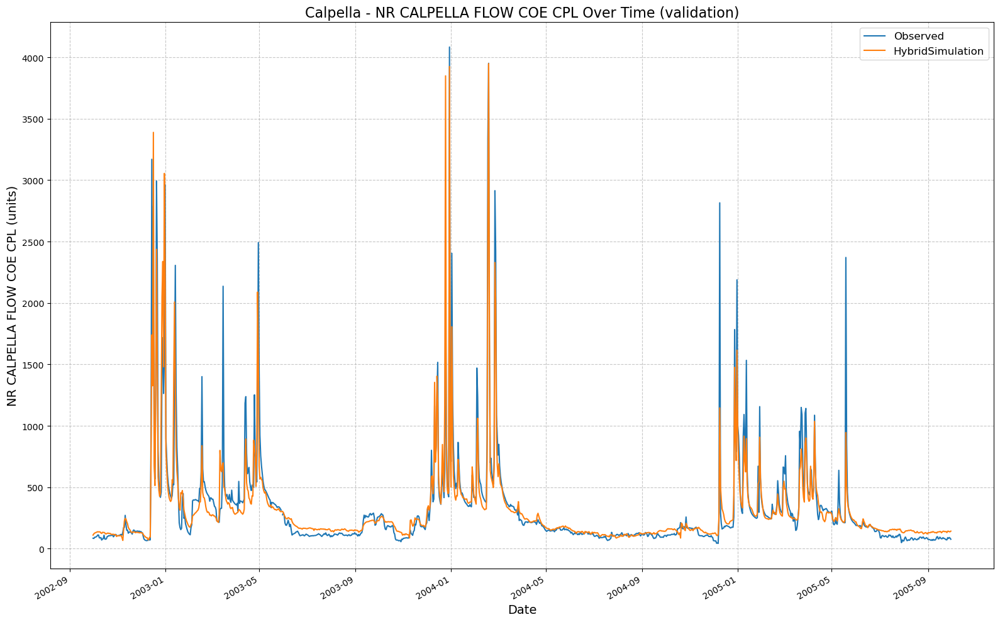

[INFO] CSV output saved at: F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\runs\testing_run_1202_211401\results_output_validation.csv
Physics metrics: {'NSE': 0.8323752284049988, 'MSE': 28715.84375, 'RMSE': 169.457498358733, 'KGE': 0.8543016445917757, 'Alpha-NSE': 0.8851125680310655, 'Beta-KGE': 0.9789151549339294, 'Beta-NSE': -0.016131401209536197, 'Pearson-r': 0.9129120097098085, 'FHV': -9.047447890043259, 'FMS': -25.698289209336934, 'FLV': 20.75783268490111, 'Peak-Timing': 0.2, 'Peak-MAPE': 41.223816871643066}


F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
F:\Dino\UCB-USACE-LSTMs\UCB_training\models\calpella_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [9]:
for approach in approaches:
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        current_hparams = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
            "save_weights_every": ep
        }
        print(f"Approach: {approach['name']} | Hyperparams: {current_hparams}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=current_hparams,
            input_features=approach["input_features"],
            physics_informed=approach["physics_informed"],
            physics_data_file=approach["physics_data_file"],
            hourly=False,
            extend_train_period=False,
            gpu=-1
        )
        trainer.train()
        csv_path, metrics_dict = trainer.results()
        row_data = {
            "model_type": approach["name"],
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout
        }
        for k, v in metrics_dict.items():
            row_data[k] = v
        search_results.append(row_data)
        print(f"{approach['name']} metrics: {metrics_dict}")

In [10]:
df_results = pd.DataFrame(search_results)
df_results.sort_values(by="NSE", ascending=False, inplace=True)
df_results.reset_index(drop=True, inplace=True)
df_results

,model_type,hidden_size,seq_length,num_layers,epochs,output_dropout,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-KGE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,Peak-MAPE
0,Physics,128,90,1,32,0.4,0.851612,25420.414062,159.437806,0.867410,0.891807,1.001386,0.001060,0.923368,-10.201643,-17.441037,15.814725,0.2,33.463748
1,Physics,64,180,2,16,0.4,0.847465,26130.820312,161.650303,0.832234,0.854364,0.967050,-0.025209,0.923516,-13.727368,-5.315871,48.527511,0.2,38.465216
2,Physics,64,90,1,16,0.4,0.845023,26549.220703,162.939316,0.891806,0.930440,0.980588,-0.014851,0.919437,-6.416707,12.745481,-95.967733,0.2,36.606598
3,Physics,64,90,2,16,0.4,0.841434,27164.015625,164.815095,0.866873,0.949430,0.905892,-0.072000,0.920571,-5.051888,21.272804,-2195.997706,0.2,34.520419
4,Physics,64,90,1,32,0.4,0.840955,27246.089844,165.063896,0.852747,0.877752,1.000974,0.000745,0.917915,-10.540631,-15.439146,42.614939,0.2,40.527205
5,Physics,256,90,1,32,0.4,0.840447,27333.097656,165.327244,0.880372,0.914541,1.009139,0.006992,0.916788,-6.713118,-13.867784,66.790899,0.0,32.945859
6,Physics,128,180,1,32,0.4,0.840189,27377.208984,165.460596,0.876860,0.909649,0.992565,-0.005688,0.916663,-8.273625,-12.451881,38.542867,0.2,39.047294
7,Physics,256,90,2,16,0.4,0.837543,27830.630859,166.825151,0.869812,0.901320,1.005978,0.004574,0.915292,-7.108688,-12.361175,65.435502,0.2,37.643976
8,Physics,64,180,1,32,0.4,0.837088,27908.492188,167.058350,0.875222,0.910692,1.019449,0.014880,0.915057,-7.508612,-10.744575,55.274250,0.2,35.252438
9,Physics,64,90,2,32,0.4,0.836945,27932.949219,167.131533,0.846745,0.871880,0.999217,-0.000599,0.915906,-11.941430,-12.829405,-82.125336,0.2,40.818567
